# Dataset analysis

This notebook is used to analyze two-photon data from a single dataset (i.e., mouse, experiment, date) across conditions and trials.

### Acquisition protocols & raw data

Raw data consist of individual 16-bit deep, 256-by-256 pixels grayscale TIF images of GCaMP6s fluorescence data acquired at a sampling rate of 3.56 Hz and spatial resolution of 1.97 μm / pixel by the Bruker microscope during experiments.

Each acquisition protocol (or run) consists of 16 sonication trials with an inter sonication interval of approximately 30s.

Each trial is divided in 2 cycles:
- The first cycle (indicated by an odd number) consists of 10 frames of the pre-stimulus interval of the trial (ca. 2.8s).
- The second cycle (indicated by an even number) consists of 90 frames of the peri and post-stimulus intervals of the trial (ca. 25.2s).

The ultrasound stimulus is delivered concurrently with the acquisition of the 10th frame of the first cycle (i.e. ca. at t = 2.8s).

The TIF images from a given run are all stored in a single folder, which is named according to a specific pattern depending on the specimen, stimulation and acquisitation parameters:

`foldername = <mouse_line>_<nframes_per_trial>frames_<PRF>Hz_<stim_duration>ms_<sampling_rate>Hz_<stim_amplitude>MPA_<stim_DC>DC-<run_ID>`

Inside this folder, individual files are named using this same pattern, together with unique cycle and frame identifers:

`filename = <foldername>_Cycle<cycle_number>_Ch2_<frame_number>.ome.tif`

This informative nomenclature is used as a way to store metadata associated with each experimental run.

Additionally, a file named `<foldername>.xml`, containing information about the microscope acquisition parameters for the run, is also stored in the data folder.

### Processing pipeline

The analysis consists of several successive steps:
1. Pre-processing of raw movie frames
2. Functional segmentation with suite2p
3. Conditioning (i.e. computation of ΔF/F0 and z-score signals)
4. Statistics (data curation, extraction of response metrics & cell classification)
5. Visualization of analysis outputs

---

In [1]:
%load_ext autoreload
%load_ext skip_kernel_extension
%autoreload 2

## Imports

In [2]:
# External packages
import logging
import os
import numpy as np
import pandas as pd
from IPython.utils import io
import jupyter_slack
import datetime
from scipy.stats import skew

# Internal modules
from logger import logger
from config import default_dataset
from constants import *
from fileops import *
from parsers import *
from stackers import stack_tifs
from viewers import view_stack
from filters import KalmanDenoiser
from correctors import LinRegCorrector
from substitutors import StackSubstitutor
from s2putils import *
from postpro import *
from plotters import *
from utils import *
from batchutils import *

## Parameters

### Input & output directories

In [3]:
dataroot = get_data_root()  # Root directory for raw data
figsdir = get_output_equivalent(dataroot, DataRoot.RAW, DataRoot.FIG)  # Directory for output figures
logger.info(f'input data root: "{dataroot}"')
logger.info(f'output figures directory: "{figsdir}"')
figs = {}  # Figures dictionary

 2023/10/26 15:31:44: input data root: "/gpfs/scratch/lemait01/data/usnm/raw"
 2023/10/26 15:31:44: output figures directory: "/gpfs/scratch/lemait01/data/usnm/figs/"


### Input dataset and main processing parameters

In [4]:
# Input parameters
analysis_type = DEFAULT_ANALYSIS  # analysis type
mouseline = 'pv' # default_dataset['mouseline']  # mouse line
expdate = '20190703' # default_dataset['expdate']  # experiment date
mouseid = 'mouse4' # default_dataset['mouseid']  # mouse number
region = 'region1' # default_dataset['region']  # brain region
layer = DEFAULT_LAYER  # cortical layer

# Processing parameters
inspect = True  # whether to inspect data for a randomly chosen run along processing steps
slack_notify = False   # notify start and completion on slack
global_correction = GLOBAL_CORRECTION  # global stack correction method
kalman_gain = KALMAN_GAIN  # gain of Kalman filter
neuropil_scaling_coeff = NEUROPIL_SCALING_COEFF  # scaling coefficient for neuropil subtraction
baseline_quantile = BASELINE_QUANTILE  # evaluation quantile for baseline computation
baseline_wquantile = BASELINE_WQUANTILE  # quantile filter window size (s) to compute fluorescence baseline
baseline_wsmoothing = BASELINE_WSMOOTHING  # gaussian filter window size (s) to smooth out fluorescence baseline
trial_aggfunc = TRIAL_AGGFUNC  # trial aggregation function
ykey_classification = YKEY_CLASSIFICATION  # Reference variable for response classification
directional = DIRECTIONAL_DETECTION  # whether to look for directional (i.e. positive only) effect for response detection
um_per_px = None  # Spatial resolution of the microscope FOV (um/pixel)
plot_rasters = True  # whether to render raster plots of population activity, or not

### Derived parameters

In [5]:
# Construct dataset ID
dataset_id = f'{expdate}_{mouseid}_{region}'
if layer != DEFAULT_LAYER:
    dataset_id = f'{dataset_id}_{layer}'

# Construct processing IDs
prepro_id = []
if global_correction is not None:
    prepro_id.append(global_correction)
if kalman_gain is not None:
    prepro_id.append(f'{kalman_gain}')
prepro_id = '_'.join(prepro_id)
baseline_id = get_baseline_id(baseline_quantile, baseline_wquantile, baseline_wsmoothing)
conditioning_id = f'alpha{neuropil_scaling_coeff}_{baseline_id}'
ykey_classification_str = {Label.DFF: 'dff', Label.ZSCORE: 'zscore'}[ykey_classification]
processing_id = f'agg{trial_aggfunc.__name__}_class{ykey_classification_str}'
if directional:
    processing_id = f'{processing_id}_directional'

# Extract input data directory
datadir = os.path.join(dataroot, analysis_type, mouseline, dataset_id)
if not os.path.exists:
    raise ValueError(f'input data directory "{datadir}" does not exist')
logger.info(f'input data directory: "{datadir}"')

# Extract figures suffix
figs_suffix = f'{mouseline}_{dataset_id}_{prepro_id}_{conditioning_id}_{processing_id}'

# Get time stamp from notebook start
tstamp_start = datetime.datetime.now()
fmts = ['%Y-%m-%d', '%H:%M:%S']
# Log start process
s = f'{dataset_id} notebook started on {tstamp_start.strftime(fmts[0])} at {tstamp_start.strftime(fmts[1])}'
if slack_notify:
    jupyter_slack.notify_self(s)
logger.info(s)

 2023/10/26 15:31:47: input data directory: "/gpfs/scratch/lemait01/data/usnm/raw/main/pv/20190703_mouse4_region1"
 2023/10/26 15:31:47: 20190703_mouse4_region1 notebook started on 2023-10-26 at 15:31:47


### Input summary table figure

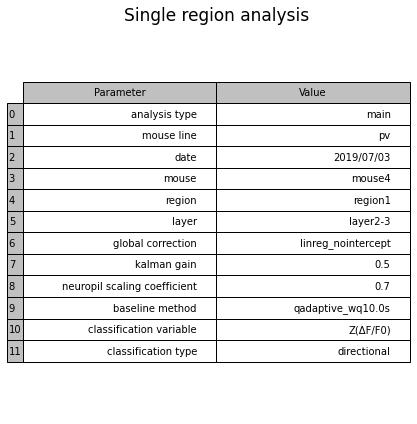

In [6]:
figs['dataset_info'] = plot_table({
    'analysis type': analysis_type,
    'mouse line': mouseline,
    'date': f'{expdate[:4]}/{expdate[4:6]}/{expdate[6:]}',
    'mouse': mouseid,
    'region': region,
    'layer': layer,
    'global correction': global_correction,
    'kalman gain': kalman_gain,
    'neuropil scaling coefficient': neuropil_scaling_coeff,
    'baseline method': baseline_id,
    'classification variable': ykey_classification,
    'classification type': f"{'' if directional else 'non '}directional"
    }, title='Single region analysis', aspect=1.5)

### Intermediate data inspection

In [7]:
nROIs_inspect = 3  # number of ROIs to look at for the inspection run (if specified)
stackdict = None  # empty stacks dictionary
runbounds = None  # empty runbounds array
istimframes_stacked = None  # empty stimulus frames array
save_gifs = False  # whether to save gifs of extracted movies or not
qref = 'q0.1'  # reference quantile code 

---
## Pre-processing (stacking, substitution, denoising)

### Gather data folders & extract acquisition settings

In [8]:
# Get raw list of subolders containing tifs, sorted by run ID
tif_folders = get_data_folders(
    datadir, 
    exclude_patterns=FOLDER_EXCLUDE_PATTERNS, 
    include_patterns=[resolve_mouseline(mouseline)], 
    sortby=Label.RUNID
)

# Extract acquisition settings from each run, and outlier runs
daq_settings, todiscard = parse_acquisition_settings(tif_folders)

# If outlier runs were found, exclude corresponding folders from analysis 
if len(todiscard) > 0:
    discard_str = '\n'.join([f'   - {os.path.basename(f)}' for f in todiscard])
    logger.warning(f'excluding the following folders from analysis:\n{discard_str}')
    tif_folders = [f for f in tif_folders if f not in todiscard]

# Extract index of baseline run, if any
irun_baseline = next((i for i, fp in enumerate(tif_folders) if '00MPA' in os.path.basename(fp)), None)
has_no_baseline_run = irun_baseline is None

# Log final folders list
folders_str = '\n'.join([f'   - {os.path.basename(f)}' for f in tif_folders])
logger.info(f'final folders list:\n{folders_str}')

# Extract spatial and temporal resolution
um_per_px = daq_settings['micronsPerPixel']
fps = 1 / daq_settings['framePeriod']

# Log acquisition settings
logger.info('acquisition settings:')
DictTable(daq_settings)

 2023/10/26 15:31:52: Searching through /gpfs/scratch/lemait01/data/usnm/raw/main/pv/20190703_mouse4_region1
 2023/10/26 15:32:02: found 16 folders containing TIF files
 2023/10/26 15:32:02: sorting folders by run ID
 2023/10/26 15:32:02: extracting acquisition settings across 16 folders...


100%|██████████| 16/16 [00:04<00:00,  3.90it/s]

 2023/10/26 15:32:06: identifying reference value for 46 settings
 2023/10/26 15:32:06: checking for settings consistency across folders...
 2023/10/26 15:32:06: found 3 acquisition setting(s) varying across runs:
                 positionCurrent XAxis  positionCurrent YAxis  \
08MPA_50DC-257                  248.52                 939.78   
08MPA_40DC-258                  248.52                 939.78   
08MPA_30DC-259                  248.52                 939.78   
08MPA_20DC-260                  248.52                 939.78   
08MPA_10DC-261                  248.52                 939.78   
08MPA_05DC-262                    0.00                   0.00   
00MPA_50DC-263                    0.00                   0.00   
06MPA_50DC-264                    0.00                   0.00   
04MPA_50DC-265                    0.00                   0.00   
02MPA_50DC-266                    0.00                   0.00   
01MPA_50DC-267                    0.00                   0.00   
005MPA

Key,Value
activeMode,Galvo
bitDepth,12.0
currentScanAmplitude XAxis,7.6
currentScanAmplitude YAxis,-7.6
currentScanCenter XAxis,0.0
currentScanCenter YAxis,0.0
dwellTime,2.8
framePeriod,0.280453201144955
interlacedScanTrackCount,0.0
laserWavelength,920.0


### Merge TIFs into stack

Raw TIF images are assembled into stacked TIF files containing all the frames of an entire run. Each resulting stacked TIF file should contain a 1600x256x256 uint16 array and is named after the directory containing the corresponding individual TIF files.

 2023/10/26 15:32:07: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_50DC-257.tif" already exists
 2023/10/26 15:32:08: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_40DC-258.tif" already exists
 2023/10/26 15:32:08: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_30DC-259.tif" already exists
 2023/10/26 15:32:08: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_20DC-260.tif" already exists
 2023/10/26 15:32:08: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_10DC-261.tif" already exists
 2023/10/26 15:32:08: "/gpfs/scratch/lemait01/data/usnm/stacked/main/pv/20190703_mouse4_region1/pv_100frames_100Hz_200ms_3.56Hz_08MPA_05DC-262.tif" already exists
 2023/10/26 15:32:08: 

100%|██████████| 1600/1600 [00:02<00:00, 653.40it/s]

 2023/10/26 15:32:16: initializing stack viewer
 2023/10/26 15:32:16: stack size: (1600, 256, 256)
 2023/10/26 15:32:16: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 699.28it/s]

 2023/10/26 15:32:18: stack dynamic range range: 0 - 1276
 2023/10/26 15:32:18: rendering stack view...


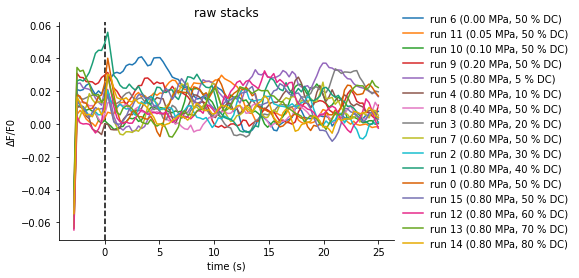

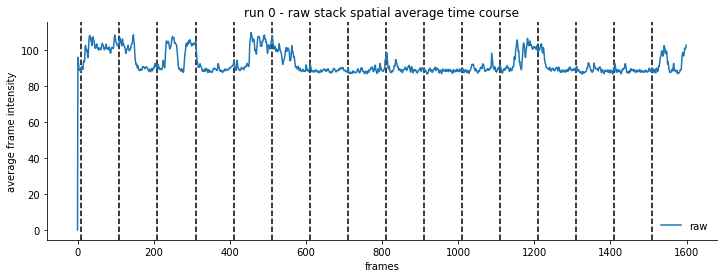

In [9]:
# Generate stacks for all TIF folders in the input data directory
raw_stack_fpaths = []
nframes_per_run = []
for tif_folder in tif_folders:
    with io.capture_output() as captured:  # turning off warning upon TIF reading
        stack_fpath, stack_shape = stack_tifs(tif_folder, overwrite=False, full_output=True)
        raw_stack_fpaths.append(stack_fpath)
        nframes_per_run.append(stack_shape[0])

# Extract number of runs
nruns = len(raw_stack_fpaths)
logger.info(f'number of runs: {nruns}')

# Draw inspected run index, if any 
irun_inspect = random.choice(np.arange(nruns)) if inspect else None # run index
stacktitle = f'run {irun_inspect}'  # default stack title

# Extract and check consistency of number of frames per run
nframes_per_run = list(set(nframes_per_run))
assert len(nframes_per_run) == 1, f'Differing stack lengths: {nframes_per_run}'
nframes_per_run = nframes_per_run[0]
logger.info(f'number of frames per run: {nframes_per_run}')

# Deduce number of trials per run
logger.info(f'number of frames per trial: {NFRAMES_PER_TRIAL}')
ntrials_per_run = nframes_per_run // NFRAMES_PER_TRIAL
logger.info(f'number of trials per run: {ntrials_per_run}')

figs['trialavg_stackavg_traces raw'] = plot_trialavg_stackavg_traces(
    raw_stack_fpaths, ntrials_per_run, title='raw stacks', iref=qref)

# Define indexes of trial start and stimulation frames for a run
i_trialstart_frames_run = np.arange(ntrials_per_run) * NFRAMES_PER_TRIAL
i_stim_frames_run = i_trialstart_frames_run + FrameIndex.STIM

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:
    # Load stack
    raw_stack = loadtif(raw_stack_fpaths[irun_inspect])

    # Plot time course of the stack spatial average
    figs[f'raw_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse(
        {'raw': raw_stack_fpaths[irun_inspect]},
        ilabels=i_stim_frames_run, title=f'run {irun_inspect} - raw stack')

    # Define stack dictionary
    stackdict = {'raw': raw_stack_fpaths[irun_inspect]}

# View stack, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

### Substitute problematic frames

- stimulation frames are highly polluted by stimulation-evoked noise -> we substitute them by their preceding frames.
- initial frames of each sonicaiton trial also seem problematic -> they are substituted by their following frames

 2023/10/26 15:32:21: all output files already exist -> skipping
 2023/10/26 15:32:21: deriving acoustic intensity information...
 2023/10/26 15:32:25: loading data from pv_100frames_100Hz_200ms_3.56Hz_08MPA_50DC-257.tif
 2023/10/26 15:32:25: loaded (1600, 256, 256) uint16 stack
 2023/10/26 15:32:25: initializing stack viewer
 2023/10/26 15:32:25: stack size: (1600, 256, 256)
 2023/10/26 15:32:25: adding 16 delimiters


100%|██████████| 1600/1600 [00:02<00:00, 658.07it/s]

 2023/10/26 15:32:30: initializing stack viewer
 2023/10/26 15:32:30: stack size: (1600, 256, 256)
 2023/10/26 15:32:30: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 748.46it/s]

 2023/10/26 15:32:32: stack dynamic range range: 0 - 1276
 2023/10/26 15:32:32: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 670.85it/s]

 2023/10/26 15:32:35: stack dynamic range range: 60 - 1276
 2023/10/26 15:32:35: rendering stack view...


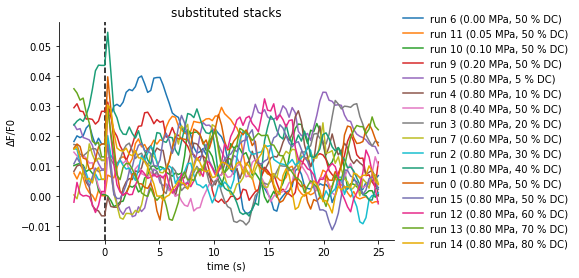

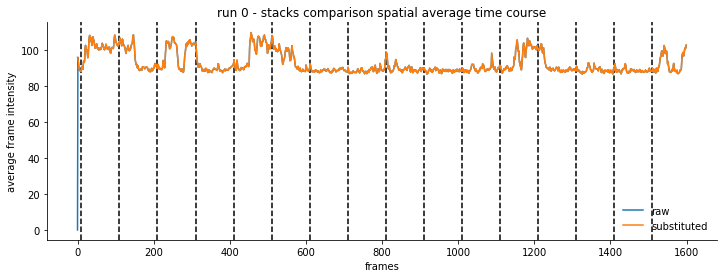

In [10]:
# Define substitutor object
submap = [
    (1, 0, None),
    (FrameIndex.STIM - 1, FrameIndex.STIM, NFRAMES_PER_TRIAL),
]
ss = StackSubstitutor(submap)

# Substitute problematic frames in every TIF stack and save outputs in specific directory 
input_root = DataRoot.STACKED
substituted_stack_fpaths = process_and_save(
    ss, raw_stack_fpaths, input_root, overwrite=False)

figs['trialavg_stackavg_traces substituted'] = plot_trialavg_stackavg_traces(
    substituted_stack_fpaths, ntrials_per_run, title='substituted stacks', iref=qref)

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:
    # Load interpolated stack for the same run
    subsituted_stack = loadtif(substituted_stack_fpaths[irun_inspect])

    # Plot comparative time course of the stacks spatial average
    figs[f'interp_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
        'raw': raw_stack_fpaths[irun_inspect],
        'substituted': substituted_stack_fpaths[irun_inspect]
        }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

    # Update stacks dictionary
    stackdict = {
        'raw': raw_stack_fpaths[irun_inspect],
        ss: substituted_stack_fpaths[irun_inspect]}

# Visualize raw and substituted stacks side-by-side, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

### Global stack correction

Goal: remove global artifacts from the stack (e.g. slow drifts in the baseline fluorescence, low-frequency fluctuations, etc.)

In [11]:
# stack = loadtif(substituted_stack_fpaths[8])
# ymed = pd.DataFrame({'ref': np.median(stack, axis=(1, 2))})
# iframes = [8, 9, 10, 11, 12, 13, 14, 15]
# stimdelimiters = np.arange(16) * 100 + 10
# codistaxes, fitaxes = None, None
# for i, lrc in enumerate([LinRegCorrector(intercept=False, qmax=0.5), LinRegCorrector(intercept=False, qmin=0.5)]):
#     color = f'C{i}'
#     refimg = lrc.get_reference_frame(stack)
#     refimgfig = lrc.plot_frame(refimg, mode='all')
#     res = lrc.fit(stack)
#     codistfig = lrc.plot_codists(
#         stack, iframes, regres=res, height=2, 
#         axes=codistaxes, color=color)
#     codistaxes = codistfig.axes
#     fitfig = lrc.plot_fit(
#         stack, params=res, 
#         # delimiters=stimdelimiters,
#         periodicity=NFRAMES_PER_TRIAL, 
#         axes=fitaxes, 
#         color=color,
#         height=2,
#         keys=['slope', 'intercept'],
#     )
#     stackout = lrc.correct(stack, res)
#     ymed[f'{lrc}'] = np.median(stackout, axis=(1, 2))
#     stimdelimiters = None
#     fitaxes = fitfig.axes

# fig, ax = plt.subplots(figsize=(8, 4))
# sns.despine(ax=ax)
# ymed.plot(ax=ax, color=['k', 'C0', 'C1']);

 2023/10/26 15:32:39: all output files already exist -> skipping
 2023/10/26 15:32:39: deriving acoustic intensity information...
 2023/10/26 15:32:42: loading data from pv_100frames_100Hz_200ms_3.56Hz_08MPA_50DC-257.tif
 2023/10/26 15:32:42: loaded (1600, 256, 256) uint16 stack
 2023/10/26 15:32:42: computing ref. image as median of frames 0 - 1599
 2023/10/26 15:32:46: ref. image skewness: 3.43
 2023/10/26 15:32:47: selecting 65536/65536 pixels within quantile range 0 - 1
 2023/10/26 15:32:47: performing linear regression on 1600 frames


100%|██████████| 1600/1600 [00:09<00:00, 177.46it/s]


 2023/10/26 15:32:56: selecting 65536/65536 pixels within quantile range 0 - 1
 2023/10/26 15:32:56: plotting intensity co-distribution of 9 frames


 89%|████████▉ | 8/9 [00:00<00:00,  8.45it/s]


 2023/10/26 15:33:08: initializing stack viewer
 2023/10/26 15:33:08: stack size: (1600, 256, 256)
 2023/10/26 15:33:08: adding 16 delimiters


100%|██████████| 1600/1600 [00:03<00:00, 521.57it/s]

 2023/10/26 15:33:13: initializing stack viewer
 2023/10/26 15:33:13: stack size: (1600, 256, 256)
 2023/10/26 15:33:13: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 730.76it/s]

 2023/10/26 15:33:16: stack dynamic range range: 60 - 1276
 2023/10/26 15:33:16: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 722.06it/s]

 2023/10/26 15:33:18: stack dynamic range range: 53 - 1298
 2023/10/26 15:33:18: rendering stack view...


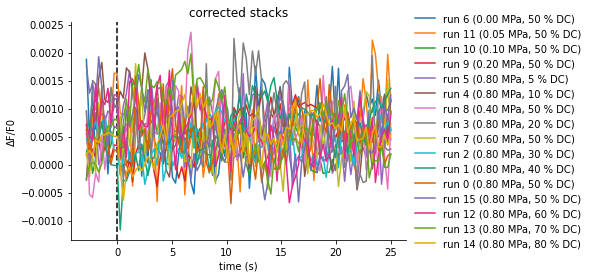

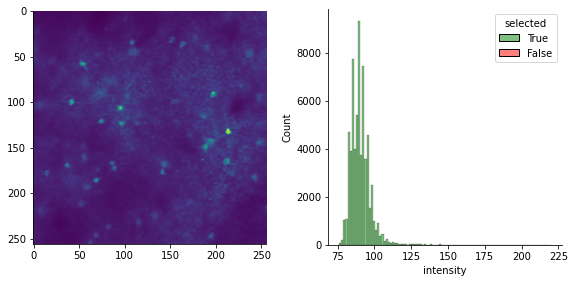

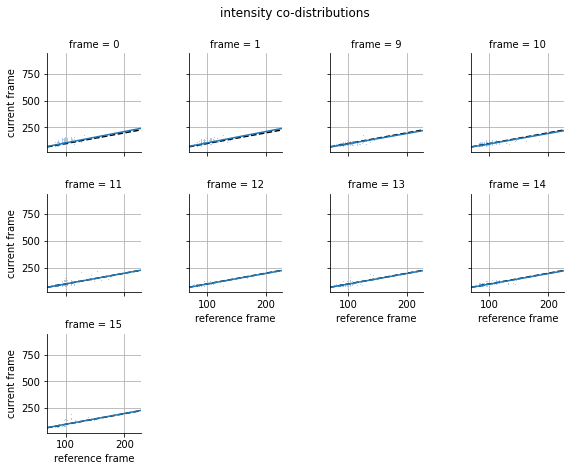

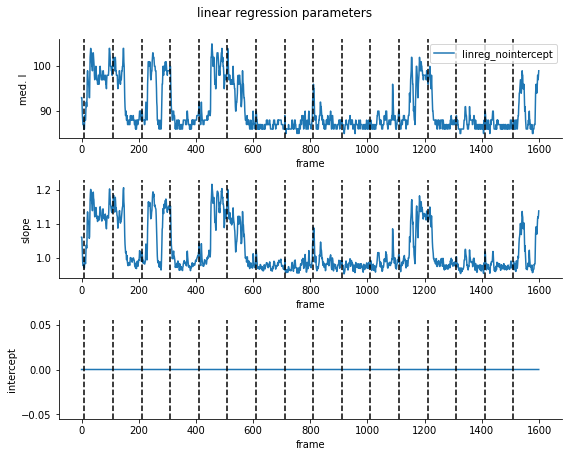

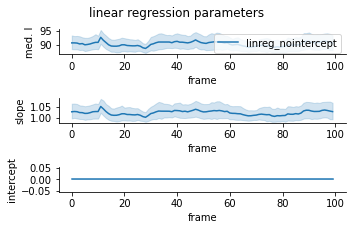

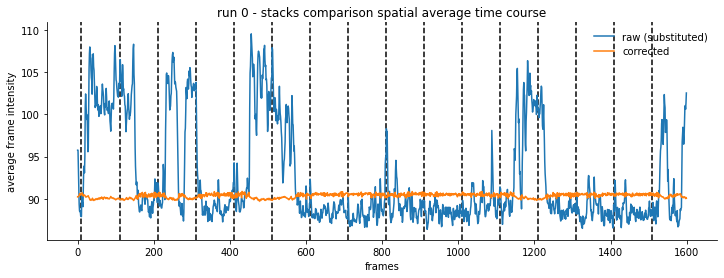

In [12]:
# Define stack corrector object
if global_correction is not None:
    lrc = LinRegCorrector.from_string(global_correction)  # real corrector object
else:
    lrc = NoProcessor()  # dummy corrector object

# Correct every TIF stack and save outputs in specific directory
input_root = DataRoot.STACKED if isinstance(ss, NoProcessor) else ss.rootcode
corrected_stack_fpaths = process_and_save(
    lrc, substituted_stack_fpaths, input_root, overwrite=False)

figs['trialavg_stackavg_traces corrected'] = plot_trialavg_stackavg_traces(
    corrected_stack_fpaths, ntrials_per_run, title='corrected stacks', iref=qref)

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:

    # Test corrector features on a single stack
    if not isinstance(lrc, NoProcessor):
        stack = loadtif(substituted_stack_fpaths[irun_inspect])
        refimg = lrc.get_reference_frame(stack)
        figs['ref_frame_dist'] = lrc.plot_frame(refimg, mode='all')
        res = lrc.fit(stack)
        figs['pixels co-dists'] = lrc.plot_codists(
            stack, [0, 1, 9, 10, 11, 12, 13, 14, 15], regres=res, height=2)
        stim_delimiters = delimiters=np.arange(16) * 100 + 10
        for periodicity in [None, NFRAMES_PER_TRIAL]:
            figs[f'corrector fit{" trialavg" if periodicity is not None else""}'] = lrc.plot_fit(
                stack, params=res, keys=['slope', 'intercept'],
                periodicity=periodicity,
                delimiters=stim_delimiters if periodicity is None else None)

    # Plot comparative time course of the stacks spatial average
    figs[f'corrected_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
        'raw (substituted)': substituted_stack_fpaths[irun_inspect],
        'corrected': corrected_stack_fpaths[irun_inspect]
        }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

    # Update stacks dictionary
    stackdict = {
        'raw (substituted)': substituted_stack_fpaths[irun_inspect],
        lrc: corrected_stack_fpaths[irun_inspect]}

# Visualize substituted and denoised stacks side-by-side, if run index is defined
view_stack(
    stackdict, 
    title=stacktitle, 
    ilabels={'STIM': i_stim_frames_run}, 
    fps=fps,
    rel_vbounds=(0, 0.3), 
    norm='all',
)

In [13]:
# view_stack(
#     stackdict, 
#     title=stacktitle, 
#     ilabels={'STIM': i_stim_frames_run}, 
#     fps=fps, 
#     rel_vbounds=(0, 0.1), 
#     norm='all',
# )

### Denoising

The aim of this step is to remove the Speckle noise present in raw microscope aqcuisition frames. To this end, we use a modified implementation of the Kalman filter. The main parameter influencing the outcome of this processing step is the *specified filter gain* (`G`). From collective experience and comparative visual inspections, it seems that values around 0.5 work well when using GCaMP6s as a fluorescence reporter.

Moreover, our modified Kalman implementation offers the advantages that
- wrong guesses of the initial variance will not prevent noise estimation but merely delay the fitting process.
- an initial baseline padding is used to absorb this fitting process.
Hence, we will fix here default parameters for the variance (`V = 0.05`) and padding length (`n = 10`).

 2023/10/26 15:33:26: all output files already exist -> skipping
 2023/10/26 15:33:26: deriving acoustic intensity information...
 2023/10/26 15:33:29: initializing stack viewer
 2023/10/26 15:33:29: stack size: (1600, 256, 256)
 2023/10/26 15:33:29: adding 16 delimiters


100%|██████████| 1600/1600 [00:02<00:00, 646.54it/s]

 2023/10/26 15:33:34: initializing stack viewer
 2023/10/26 15:33:34: stack size: (1600, 256, 256)
 2023/10/26 15:33:34: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 745.56it/s]

 2023/10/26 15:33:37: stack dynamic range range: 53 - 1298
 2023/10/26 15:33:37: computing stack dynamic range across frames 0 - 1599...



100%|██████████| 1600/1600 [00:02<00:00, 751.98it/s]

 2023/10/26 15:33:39: stack dynamic range range: 58 - 898
 2023/10/26 15:33:39: rendering stack view...


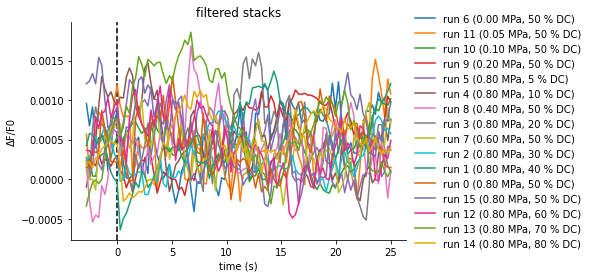

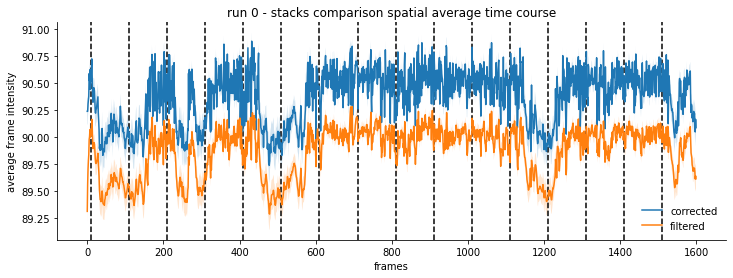

In [14]:
# Define Kalman filter
if kalman_gain is not None and kalman_gain > 0:
    kd = KalmanDenoiser(G=kalman_gain, V=0.05, npad=10)  # real filter object
else:
    kd = NoProcessor()  # dummy filter object used to work on raw stacks

# Denoise every TIF stack and save outputs in specific directory
input_root = ss.rootcode if isinstance(lrc, NoProcessor) else lrc.rootcode
filtered_stack_fpaths = process_and_save(kd, corrected_stack_fpaths, input_root, overwrite=False)

figs['trialavg_stackavg_traces filtered'] = plot_trialavg_stackavg_traces(
    filtered_stack_fpaths, ntrials_per_run, title='filtered stacks', iref=qref)

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:
    # Plot comparative time course of the stacks spatial average
    figs[f'filtered_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse({
        'corrected': corrected_stack_fpaths[irun_inspect],
        'filtered': filtered_stack_fpaths[irun_inspect]
        }, ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')

    # Update stacks dictionary
    stackdict = {
        lrc: corrected_stack_fpaths[irun_inspect],
        kd: filtered_stack_fpaths[irun_inspect]}

# Visualize substituted and denoised stacks side-by-side, if run index is defined
view_stack(
    stackdict, title=stacktitle, ilabels={'STIM': i_stim_frames_run}, fps=fps, rel_vbounds=(0, 0.3))

---

## Functional segmentation (suite2p)

The denoised TIF stacks are fed into the *suite2p* pipeline to extract cell-specific fluorescence timeseries. This consists of several sub-steps:
- conversion from TIF to binary data "movie"
- motion correction using (rigid & non-rigid) movie registration
- movie projection at various spatial scales to compute a "correlation map"
- iterative peak detection on correlation map, and extension around these peaks to determine regions of interest (ROIs)
- extraction of associated "neuropil" areas around each ROI (contaning contaminating signals originating from axons & dendrites located outside of the plane of interest but in the acquisition volume)
- ROI classification into cell (i.e. soma) and non-cell (e.g. axons, dendrites...) ROIs based on extracted features of ROI activity (skewness, variance, correlation to surrounding pixels) and anatomy (area, aspect ratio), using a naive Bayes classifier trained on cortical data
- extraction of ROI's calcium fluorescence timecourse and optional spike deconvolution.

**Important**: if multiple stacked TIF files are provided as input, suite2p will **stack them sequentially prior to processing**. Therefore, **all stacked TIF files in the input folder must correspond to the same brain region**.

Upon completion, suite2p produces the following output files:
- `F.npy`: array of fluorescence traces (ROIs by timepoints)
- `Fneu.npy`: array of neuropil fluorescence traces (ROIs by timepoints)
- `spks.npy`: array of deconvolved traces (ROIs by timepoints)
- `stat.npy`: array of statistics computed for each cell (ROIs by 1)
- `ops.npy`: options and intermediate outputs (identical to the output of the run_s2p function)
- `iscell.npy`: specifies whether an ROI is a cell, first column is 0/1, and second column is probability that the ROI is a cell based on the default classifier
- `data.bin` (optional): registered image stack in binary format format.

These files are saved in a folder renamed after the suite2p execution parameters.

 2023/10/26 15:33:41: parsed frame rate = 3.56 fps
 2023/10/26 15:33:41: Suite2p input directory:
/gpfs/scratch/lemait01/data/usnm/filtered/kd_G0.5_V0.05_npad10/linreg_nointercept/submap_0<-1_9->10every100/main/pv/20190703_mouse4_region1
 2023/10/26 15:33:41: running suite2p 0.10.2 with the following options:
{'denoise': False,
 'do_registration': 1,
 'fs': 3.56,
 'nonrigid': True,
 'reg_tif': True,
 'tau': 1.25}
 2023/10/26 15:33:41: suite2p code "suite2p_fs_3.56_reg_tif_tau_1.25"
 2023/10/26 15:33:41: found all suite2p output files in "/gpfs/scratch/lemait01/data/usnm/segmented/suite2p_fs_3.56_reg_tif_tau_1.25/kd_G0.5_V0.05_npad10/linreg_nointercept/submap_0<-1_9->10every100/main/pv/20190703_mouse4_region1"
 2023/10/26 15:33:41: run options match 100% -> ignoring
 2023/10/26 15:33:41: empty data path -> no run
 2023/10/26 15:33:41: extracted data contains 277 ROIs
 2023/10/26 15:33:41: extracting background pixels mask
 2023/10/26 15:33:42: found 33795 background pixels (i.e. 51.57% 

100%|██████████| 1600/1600 [00:03<00:00, 510.34it/s]


 2023/10/26 15:34:03: initializing stack viewer
 2023/10/26 15:34:03: stack size: (25600, 256, 256)
 2023/10/26 15:34:03: frame frange: [0, 1599]


100%|██████████| 1600/1600 [00:01<00:00, 951.91it/s] 

 2023/10/26 15:34:05: plotting suite2p registration offsets...
 2023/10/26 15:34:05: plotting suite2p registered images...


 2023/10/26 15:34:05: plotting suite2p sparse projection maps...
 2023/10/26 15:34:06: plotting suite2p identified ROIs...
 2023/10/26 15:34:07: initializing stack viewer
 2023/10/26 15:34:07: stack size: (25600, 256, 256)
 2023/10/26 15:34:07: frame frange: [0, 1599]
 2023/10/26 15:34:07: computing stack dynamic range across frames 0 - 1599...


100%|██████████| 1600/1600 [00:01<00:00, 1085.99it/s]

 2023/10/26 15:34:09: stack dynamic range range: 60.0 - 858.0
 2023/10/26 15:34:09: rendering stack view...


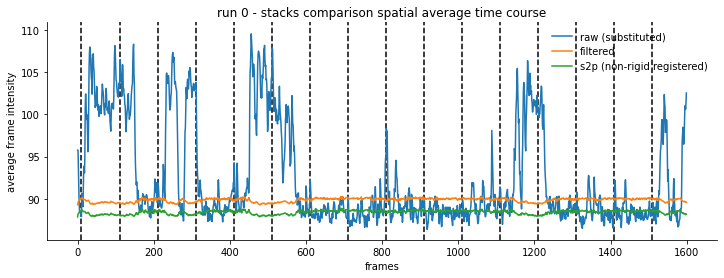

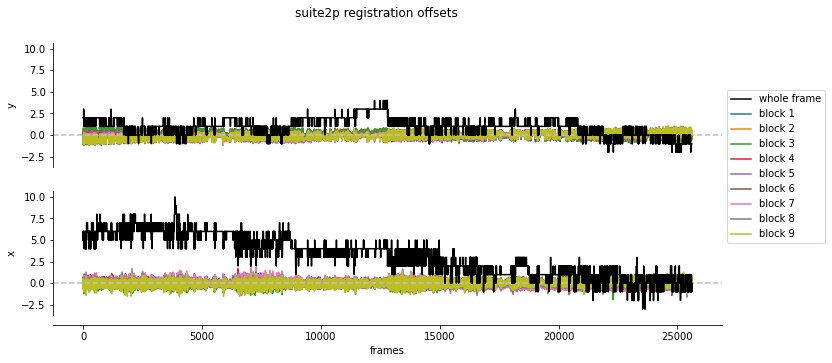

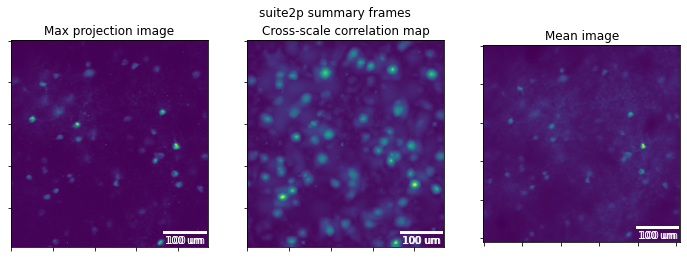

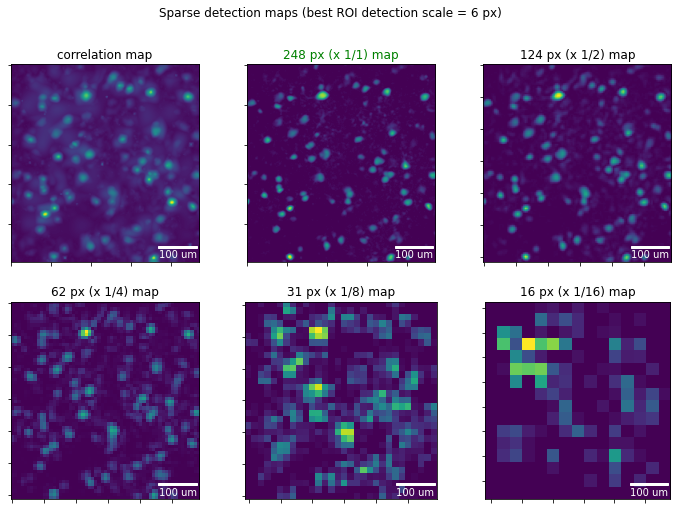

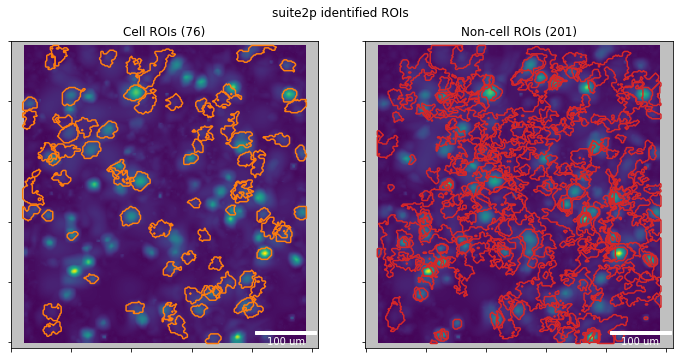

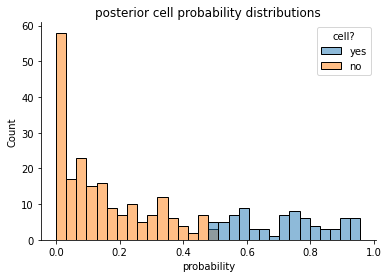

In [15]:
# Determine input filepaths and names (filtered stacks)
s2p_input_fpaths = filtered_stack_fpaths
s2p_input_fnames = [os.path.basename(f) for f in s2p_input_fpaths]

# Parse input files into info table and extract FPS from it
input_info_table = get_info_table(s2p_input_fpaths, ntrials_per_run=ntrials_per_run)
fps = get_singleton(input_info_table, Label.FPS)
logger.info(f'parsed frame rate = {fps} fps')

# Get the parent folder of input filepaths
s2p_input_dirs = list(set(os.path.split(x)[0] for x in s2p_input_fpaths))
assert len(s2p_input_dirs) == 1, 'More than 1 suite2p input directory'
s2p_input_dir = s2p_input_dirs[0]
logger.info(f'Suite2p input directory:\n{s2p_input_dir}')

# Define suite2p custom options
ops = {
    'tau': TAU_GCAMP6S_DECAY,  # timescale of the sensor
    'fs': fps,  # sampling rate (per plane)
    'do_registration': 1,  # whether or not to perform image registration,
    'reg_tif': True,  # whether or not to write the registered binary to tiff files
    'nonrigid': True,  # whether or not to perform non-rigid registration, which splits the field of view into blocks and computes registration offsets in each block separately.
    'denoise': False,  # perform PCA denoising of the registered stack prior to ROI detection
}

# Run suite2p with custom options
seg_input_key = input_root if isinstance(kd, NoProcessor) else 'filtered'
s2p_outdir = run_s2p_and_rename(
    ops=ops, db={'data_path': [s2p_input_dir], 'tiff_list': s2p_input_fnames},
    overwrite='?', input_key=seg_input_key)

# Load suite2p output data and extract options dictionary
s2p_data = get_suite2p_data(s2p_outdir, withops=True, s2p_outdir=s2p_outdir)
s2p_ops = s2p_data.pop('ops')
outstack_label = get_s2p_stack_label(s2p_ops)

# Extract background mask and associated mean fluorescence time course
background_mask, background_F = extract_s2p_background(s2p_ops, s2p_data['stat'])

# Check that number of runs and number of frames per run extracted from suite2p output
# are consistent with suite2p inputs
nruns_out = len(s2p_ops['filelist'])
assert nruns == nruns_out, f'inconsistent number of runs between input and output: {nruns} and {nruns_out}'
del nruns_out
nframes_per_run_out = list(set(s2p_ops['frames_per_file']))
assert len(nframes_per_run_out) == 1,  'inconsistent number of frames for each run in output'
nframes_per_run_out = nframes_per_run_out[0]
assert nframes_per_run == nframes_per_run_out, f'inconsistent number of frames per run between input and output: {nframes_per_run} and {nframes_per_run_out}'
del nframes_per_run_out

# Generate info table from suite2p output
output_info_table = get_info_table(s2p_ops['filelist'], ntrials_per_run=ntrials_per_run)

# Check that file order is consistent between suite2p inputs
output_to_input_mapping = (output_info_table['code'].values[:, None] == input_info_table['code'].values).argmax(axis=0)
if np.any(output_to_input_mapping != np.arange(len(output_to_input_mapping))):
    raise ValueError('inconsistent run order in inputs and outputs')
del output_info_table['code']

# Get index of zero pressure run
try:
    irun_P0 = output_info_table[output_info_table[Label.P] == 0.].index[0]
    logger.info(f'zero pressure run index = {irun_P0}')
except IndexError as err:
    irun_P0 = None
    logger.warning('no zero-pressure run found')

# Log info table
logger.info(
    f'output info table corresponding to suite2p processing order:\n{output_info_table}')

# If run index is defined, inspect stack metrics for that particular run
if irun_inspect is not None:

    # View output stack
    istimframes_stacked = np.tile(i_stim_frames_run, (nruns, 1))
    for i in range(nruns):
        istimframes_stacked[i] += i * nframes_per_run
    istimframes_stacked = istimframes_stacked.flatten()
    runbounds = [nframes_per_run * irun_inspect, nframes_per_run * (irun_inspect + 1) - 1]
    stackdict = s2p_ops
    stacktitle = f'{outstack_label} stack (run {irun_inspect})'
    registered_stack = get_s2p_stack(s2p_ops, bounds=runbounds)

    # Plot comparative time course of the stacks spatial average
    # That is a good opportunity to check that our mapping of input stacks
    # to suite2p output stacks is correct.
    fig = plot_stack_timecourse({
        'raw (substituted)': substituted_stack_fpaths[irun_inspect],
        'filtered': filtered_stack_fpaths[irun_inspect]
        },
        ilabels=i_stim_frames_run, title=f'run {irun_inspect} - stacks comparison')
    figs[f'registered_stack_timecourse_run{irun_inspect}'] = plot_stack_timecourse(
        s2p_ops, title=outstack_label, fbounds=runbounds, ax=fig.axes[0])

# Plot registration offsets over time
figs['registered_offsets'] = plot_suite2p_registration_offsets(
    s2p_ops, title='suite2p registration offsets')

# Plot suite2p summary images
figs['registered_images'] = plot_suite2p_registration_images(
    s2p_ops, title='suite2p summary frames', um_per_px=um_per_px)

# Plot sparse detection maps
figs['sparse_maps'] = plot_suite2p_sparse_maps(
    s2p_ops, um_per_px=um_per_px)

# Plot detected ROIs on FOV
figs['identified_ROIs'] = plot_suite2p_ROIs(
    s2p_data, s2p_ops, title='suite2p identified ROIs',
    um_per_px=um_per_px, mode='contour')

# Plot posterior cell probabilities for all ROIs 
figs['ROI_prob_dists'] = plot_suite2p_ROI_probs(s2p_data['iscell'])

# Visualize registered stack, if run index is defined
view_stack(
    stackdict, 
    fbounds=runbounds,
    title=stacktitle, 
    ilabels=None if irun_inspect is None else {'STIM': i_stim_frames_run + nframes_per_run * irun_inspect}, 
    fps=fps, 
    rel_vbounds=(0, 0.3))

---

## Signal conditioning

The main aim of this step is to convert the raw fluorescence timeseries of each ROI (extracted from the suite2p output files) to normalized fluorescence timeseries. This is carried out in successive sub-steps:
- extraction of cell and associated neuropil fluorescence traces
- subtraction of neuropil background with an appropriate coeefficient (currently 0.7) to obtain a corrected fluorescence timecourse (F) of each ROI
- baseline (F0) computation and baseline correction of neuropil-corrected fluorescence traces (on a run-specific basis)
- baseline normalization to obtain relative change fluorescence traces ΔF/F0 (also run-specific)
- noise level and variation range estimation and subsequent noise-normalization of relative change fluorescence traces into z-score traces.

Upon completion, a "conditioned" file is created named after the dataset (date, mouse, region) ID, in which the following outputs are saved:
- `info_table`: summary table of the parameters pertaining to each run
- `ROI_masks`: table of the pixel masks of each selected ROI in the reference frame.
- `timeseries`: dff and z-score timeseries (along with their ROI, run, trial and frame index information)

### Load conditioned data if available

In [16]:
s2p_outbase, s2p_basedir = os.path.split(s2p_outdir)
conditioning_dir = get_output_equivalent(
    s2p_outbase, DataRoot.SEGMENTED, f'{DataRoot.CONDITIONED}/{conditioning_id}')
conditioned_fpath = os.path.join(conditioning_dir, f'{s2p_basedir}.h5')
try:
    logger.info('loading data...')
    xtimeseries, popagg_timeseries, output_info_table, ROI_masks = load_conditioned_dataset(
        conditioned_fpath)
    is_conditioned_data_available = True
    logger.info(f'experiment info table:\n{output_info_table}')
    logger.info(f'conditioned timeseries: {describe_dataframe_index(xtimeseries)} dataframe')
    logger.info(f'conditioned population-average timeseries: {describe_dataframe_index(popagg_timeseries)} dataframe')
    logger.info(f'ROI masks: {describe_dataframe_index(ROI_masks)} dataframe')
except FileNotFoundError as err:
    logger.warning(err)
    is_conditioned_data_available = False

 2023/10/26 15:34:14: loading data...
 2023/10/26 15:34:15: loading experiment info table...
 2023/10/26 15:34:15: loading conditioned timeseries data...
 2023/10/26 15:34:15: loading conditioned population-average timeseries data...
 2023/10/26 15:34:15: loading ROI masks...
 2023/10/26 15:34:15: data successfully loaded
 2023/10/26 15:34:15: experiment info table:
    line  trial_length  PRF (Hz)  duration (s)   fps  P (MPa)  DC (%)  run ID  \
run                                                                             
0     pv           100     100.0           0.2  3.56     0.80    50.0     257   
1     pv           100     100.0           0.2  3.56     0.80    40.0     258   
2     pv           100     100.0           0.2  3.56     0.80    30.0     259   
3     pv           100     100.0           0.2  3.56     0.80    20.0     260   
4     pv           100     100.0           0.2  3.56     0.80    10.0     261   
5     pv           100     100.0           0.2  3.56     0.80   

### Get fluorescence timeseries data

In [17]:
%%skip $is_conditioned_data_available

# Get fluorescence timeseries
raw_timeseries = arrays_to_dataframe({
    Label.F_ROI: s2p_data['F'],
    Label.F_NEU: s2p_data['Fneu']},
    dim_names=[Label.ROI, Label.FRAME])
logger.info(f'assembled ({describe_dataframe_index(raw_timeseries)}) fluorescence timeseries dataframe')

# Split the data into separate runs
run_delimiters = np.arange(nruns + 1) * nframes_per_run
raw_timeseries = separate_runs(raw_timeseries, nruns)
logger.info(f'reshaped dataframe into ({describe_dataframe_index(raw_timeseries)}) form')

# Split the data into separate trials
stim_delimiters = np.arange(ntrials_per_run) * NFRAMES_PER_TRIAL + FrameIndex.STIM
raw_timeseries = separate_trials(raw_timeseries, ntrials_per_run)
logger.info(f'reshaped dataframe into ({describe_dataframe_index(raw_timeseries)}) form')

# Add time to table
raw_timeseries[Label.FPS] = fps
raw_timeseries = add_time_to_table(raw_timeseries)

# Filter out non-cell ROIs
logger.info('discarding non-cell ROIs...')
iscell = s2p_data['iscell'][:, 0]
icells = np.flatnonzero(iscell)
raw_timeseries = raw_timeseries.loc[(icells), :]
s2p_data = filter_s2p_data(s2p_data, icells)
logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Discard outliers based on morphological properties (if specified)
from constants import NPIX_RATIO_THR
if NPIX_RATIO_THR is not None:
    # Plot ratio of (# pixels in the whole ROI) / (# pixels in its soma) for each ROI
    # and identify outlier ROIs
    logger.info('identifying outliers based on # pixels ratio...')
    figs['npix_ratio'], df_outliers = plot_npix_ratio_distribution(
        s2p_data['stat'], thr=NPIX_RATIO_THR)
    df_outliers[Label.ROI] = icells
    df_outliers = df_outliers.set_index(Label.ROI)
    ioutliers = np.flatnonzero(df_outliers['is_outlier'])

    # Discard outliers from data
    logger.info('updating dataset...')
    ivalids = np.flatnonzero(~df_outliers['is_outlier'])
    raw_timeseries = raw_timeseries.loc[(df_outliers.iloc[ivalids].index), :]
    s2p_data = filter_s2p_data(s2p_data, ivalids)
    logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

    # Plot filtered ROIs map
    figs['filtered_ROIs'] = plot_suite2p_ROIs(
        s2p_data, s2p_ops, title='filtered suite2p ROIs',
        um_per_px=um_per_px, superimpose=True)

    # Log identified outliers
    logger.info(f'identified {len(ioutliers)} outlier(s):')
    df_outliers.iloc[ioutliers]

# Extract max F_ROI value of each ROI across time
F_ROI_max = raw_timeseries[Label.F_ROI].groupby(Label.ROI).max().rename(Label.MAX_F_ROI)

# Identify invalid ROIs with zero F_ROI range 
logger.info('identifying outliers with zero fluorescence traces...')
df_invalids = F_ROI_max.to_frame()
df_invalids['is_invalid'] = F_ROI_max == 0
iinvalids = np.flatnonzero(df_invalids['is_invalid'])

# Plot histogram distribution of max F_ROI across ROIs
fig, ax = plt.subplots()
ax.set_title(f'max {Label.F_ROI} distribution across ROIs')
sns.despine(ax=ax)
sns.histplot(df_invalids, x=Label.MAX_F_ROI, hue='is_invalid', bins=50, ax=ax)

# Discard invalid ROIs from data
logger.info('updating dataset...')
ivalids = np.flatnonzero(~df_invalids['is_invalid'])
raw_timeseries = raw_timeseries.loc[(df_invalids.iloc[ivalids].index)]
s2p_data = filter_s2p_data(s2p_data, ivalids)
logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Create dataframe to store stats on valid ROIs
ROIstats = pd.DataFrame(index=raw_timeseries.index.unique(Label.ROI))

# Plot filtered ROIs map
figs['filtered_ROIs'] = plot_suite2p_ROIs(
    s2p_data, s2p_ops, title='filtered suite2p ROIs',
    um_per_px=um_per_px, superimpose=True)

# Plot fluorescence traces for all selected ROIs 
figs['F_ROI_traces_allROIs'] = plot_ROI_traces(raw_timeseries, Label.F_ROI)

# Plot aggregate traces (both ROI - neuropil comparison and ROI across runs)
figs[f'{Label.F_ROI} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fps, [Label.F_ROI, Label.F_NEU], icorrect=qref)
figs[f'{Label.F_ROI} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.F_ROI, hue=Label.RUN, icorrect=qref)

# Compute and plot skewness of ROI and associated neuropil traces
skewnesses = raw_timeseries[[Label.F_ROI, Label.F_NEU]].groupby(Label.ROI).agg(skew)
ROIstats = pd.concat([ROIstats, skewnesses.add_suffix(' skewness')], axis=1)
jg = sns.jointplot(
    data=ROIstats, x=f'{Label.F_ROI} skewness', y=f'{Label.F_NEU} skewness', height=4)
harmonize_jointplot_limits(jg)
add_jointplot_line(jg, 0.)
jg.ax_joint.axline((0, 0), (1, 1), ls='--', color='k')
figs['ROI vs NEU skewnesses'] = jg.figure

# Log identified invalids
logger.info(f'identified {len(iinvalids)} invalid ROI(s):')
df_invalids.iloc[iinvalids]

# Select subset of ROIs to plot
iROIs = raw_timeseries.index.unique(level=Label.ROI)
if nROIs_inspect > 0:
    skewvals = np.linspace(*bounds(ROIstats[f'{Label.F_ROI} skewness']), nROIs_inspect)
    iROI_inspect = np.array([np.abs(ROIstats[f'{Label.F_ROI} skewness'] - s).idxmin() for s in skewvals])
    iROI_inspect.sort()  # sort ROIs subset to ensure consistent looping
    logger.info(f'randomly selecting {len(iROI_inspect)} ROI(s) for plotting (index(es) = {iROI_inspect})')

    # Plot longitudinal fluorescence traces for selected ROI
    figs['raw_F_traces'] = plot_multivar_traces(
        raw_timeseries[[Label.F_ROI, Label.F_NEU]], ylabel=Label.F,
        iROI=iROI_inspect, delimiters=run_delimiters)

### Compute neuropil-corrected fluorescence data

In [18]:
%%skip $is_conditioned_data_available

# Compute ROI-specific neuropil coefficients minimizing specific cost function
costfunc = force_positive_Fc(center_around(neuropil_scaling_coeff))
alpha_bounds = (-.2, 2)
optfunc = lambda x: optimize_alpha(x, costfunc, bounds=alpha_bounds)
logger.info(f'computing neuropil coefficients minimizing {costfunc.__name__} function '
            f'within {alpha_bounds} interval...')
groups = raw_timeseries.groupby(Label.ROI)
with tqdm(total=groups.ngroups - 1, position=0, leave=True) as pbar:
    alphas = groups.apply(pbar_update(optfunc, pbar)).rename(Label.ALPHA)

# Plot resulting distribution of neuropil subtraction coefficients
figs['neuropil coeffs'], ax = plt.subplots()
sns.despine(ax=ax)
ax.set_title('optimal neuropil scaling coefficients across ROIs')
sns.violinplot(data=alphas.to_frame(), y=Label.ALPHA, ax=ax)
ax.set_ylim(*alpha_bounds)

# Subtract neuropil background fluorescence for each ROI of interest
logger.info(f'subtracting neuropil background...')
raw_timeseries[Label.F] = raw_timeseries[Label.F_ROI] - alphas * raw_timeseries[Label.F_NEU]

# Plot corrected fluorescence for all ROIs
figs['F_traces_allROIs'] = plot_ROI_traces(raw_timeseries, Label.F)

# Plot aggregate traces
figs[f'{Label.F} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fps, [Label.F, Label.F_ROI, Label.F_NEU], icorrect=qref)
figs[f'{Label.F} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.F, hue=Label.RUN, icorrect=qref)

# Compute skewness of corrected fluoresence traces and plot against that of original traces
ROIstats[f'{Label.F} skewness'] = raw_timeseries[Label.F].groupby(Label.ROI).agg(skew)
jg = sns.jointplot(
    data=ROIstats, x=f'{Label.F_ROI} skewness', y=f'{Label.F} skewness', height=4)
harmonize_jointplot_limits(jg)
add_jointplot_line(jg, 0.)
jg.ax_joint.axline((0, 0), (1, 1), ls='--', color='k')
figs['ROI vs corrected skewnesses'] = jg.figure

if nROIs_inspect > 0:
    # Plot longitudinal fluorescence traces for selected ROI
    alphas_plt = alphas.loc[iROI_inspect].groupby(Label.ROI).first()
    title = [f'{Label.ALPHA} = {a:.2f}' for a in alphas_plt]
    figs['F_trace'] = plot_multivar_traces(
        raw_timeseries[[Label.F]],
        iROI=iROI_inspect, delimiters=run_delimiters, title=title)
    if irun_inspect is not None:
        # Highlight selected run on figure
        for ax in figs['F_trace'].axes:
            ax.axvspan(run_delimiters[irun_inspect], run_delimiters[irun_inspect + 1],
                       color='silver', alpha=0.5)

### Baseline computation & correction

The baseline of fluorescence signals is computed by applying consecutively (1) a percentile sliding window and (2) a gaussian filter, over the entire fluorescence timecourse. 

<span style="color:orange">This is performed independently for each cell (obviously) but also for each run owing to potential discontinuities in acquisition conditions across runs (especially since the stacking order of these runs does not necessarily follow the original chronological order of acquisition).</span>

Extracted baselines are then used to correct fluorescence signals from slow drifts, by subtraction of the mean-corrected time-varying baseline.

In [19]:
%%skip $is_conditioned_data_available

# Map skewness to baseline extraction quantile
ROIstats['quantile'] = skew_to_quantile(ROIstats[f'{Label.F} skewness'])
jg = sns.jointplot(data=ROIstats, x=f'{Label.F} skewness', y='quantile', height=4, ylim=(0, 1))
add_jointplot_line(jg, 0., mode='x')
add_jointplot_line(jg, 0.5, mode='y')
figs['skew - quantile map'] = jg.figure

# Quantile-based function
bfunc = get_quantile_baseline_func(
    fps, 
    wquantile=baseline_wquantile, 
    q=baseline_quantile, 
    wsmooth=baseline_wsmoothing
)

# Compute baseline for each ROI
logger.info('computing baseline for each ROI')
groups = raw_timeseries[Label.F].groupby(Label.ROI)
with tqdm(total=groups.ngroups - 1, position=0, leave=True) as pbar:
    raw_timeseries[Label.F0] = groups.transform(pbar_update(bfunc, pbar))

# Extract mininimum of max baseline value of each ROI across runs
F0_max_min = (
    raw_timeseries[Label.F0]
    .groupby([Label.ROI, Label.RUN]).max()
    .groupby(Label.ROI).min()
)
# Identify invalid ROIs with zero baseline fluorescence 
logger.info('identifying outliers with at least 1 zero baseline fluorescence trace...')
df_invalids = F0_max_min.to_frame()
df_invalids['is_invalid'] = F0_max_min == 0.
iinvalids = np.flatnonzero(df_invalids['is_invalid'])
ivalids = np.flatnonzero(~df_invalids['is_invalid'])

# If any invalids identified
if len(iinvalids) > 0:
    # Log identified invalids
    logger.info(f'identified {len(iinvalids)} invalid ROI(s):\n{df_invalids.iloc[iinvalids]}')
    # Discard invalid ROIs from data
    logger.info('updating dataset...')
    raw_timeseries = raw_timeseries.loc[(df_invalids.iloc[ivalids].index)]
    ROIstats = ROIstats.loc[(df_invalids.iloc[ivalids].index)]
    s2p_data = filter_s2p_data(s2p_data, ivalids)
    iROI_inspect = np.array(list(set(iROI_inspect) - set(df_invalids.iloc[iinvalids].index)))
    nROIs_inspect = iROI_inspect.size
    logger.info(f'filtered to {describe_dataframe_index(raw_timeseries)} fluorescence timeseries dataframe')

# Plot original and baseline fluorescence of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'F_F0_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.F, Label.F0]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters, title=baseline_id)

# Apply mean correction to remaining fluorescence and baseline signals
logger.info('subtracting mean-corrected baseline from signals for each ROI & run...')
F0_mean = raw_timeseries[Label.F0].groupby([Label.ROI, Label.RUN]).mean()
F0_mean_exp = expand_to_match(F0_mean, raw_timeseries.index)
# Apply baseline corretor to both fluorescence and baseline signals
detrender = raw_timeseries[Label.F0] - F0_mean_exp
raw_timeseries[Label.F_DETRENDED] = raw_timeseries[Label.F] - detrender
raw_timeseries[Label.F0_DETRENDED] = raw_timeseries[Label.F0] - detrender

# Plot detrended fluorescence for all ROIs
figs['Ftraces_allROIs_detrended'] = plot_ROI_traces(raw_timeseries, Label.F_DETRENDED)

# Plot aggregate traces
figs[f'{Label.F_DETRENDED} aggregate traces comp'] = plot_aggregate_traces(
    raw_timeseries, fps, [Label.F, Label.F_DETRENDED], icorrect=qref)
figs[f'{Label.F_DETRENDED} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.F_DETRENDED, hue=Label.RUN, icorrect=qref)

### ΔF/F0 computation

In [20]:
%%skip $is_conditioned_data_available

# Compute relative change in fluorescence
logger.info('computing dFF...')
raw_timeseries[Label.DFF] = (
    raw_timeseries[Label.F_DETRENDED] - raw_timeseries[Label.F0_DETRENDED]) / raw_timeseries[Label.F0_DETRENDED]

# # Subtract pre-stimulus run average from dFF traces
# logger.info('subtracting pre-stimulus run average from dFF traces...')
# dFF_prestim_mean = raw_timeseries.loc[pd.IndexSlice[:, :, :, FrameIndex.PRESTIM], Label.DFF].groupby(
#     [Label.ROI, Label.RUN]).mean()
# raw_timeseries[Label.DFF] -= expand_to_match(dFF_prestim_mean, raw_timeseries.index)

# Plot aggregate traces
figs[f'{Label.DFF} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.DFF, hue=Label.RUN)

# Compare with and without first trial
figs[f'{Label.DFF} agg traces w/w. first trial'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.DFF)
ax = figs[f'{Label.DFF} agg traces w/w. first trial'].axes[0]
plot_aggregate_traces(
    raw_timeseries.loc[pd.IndexSlice[:, :, 1:, :]], fps, Label.DFF, ax=ax)
ax.legend(fig.axes[0].lines[1::2], ['all trials', 'without first trial'])

# Plot DFF for all ROIs
nROIs = len(raw_timeseries.index.unique(level=Label.ROI))
figs['DFFtraces_allROIs'] = plot_ROI_traces(
    raw_timeseries, Label.DFF, ydelimiters=np.zeros(nROIs), stacked=True, ntraces=20)

# Plot consecutive trials of relative fluorescence change of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'dFF_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.DFF]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters)
    for ax in figs[f'dFF_trace_run{irun_inspect}'].axes:
        ax.axhline(0., c='k', ls='--');

### Z(ΔF/F0) computation

In [21]:
%%skip $is_conditioned_data_available

# Fit gaussians to dFF histogram distributions
logger.info('fitting gaussians to dFF histogram distributions...')
groups = raw_timeseries[Label.DFF].groupby(Label.ROI)
with tqdm(total=groups.ngroups, position=0, leave=True) as pbar:
    dFF_histfits = groups.agg(pbar_update(nan_proof(gauss_histogram_fit), pbar))
nbins = dFF_histfits.iloc[0][0].size
logger.info('extracting fitted gaussian parameters...')
dFF_histparams = dFF_histfits.apply(lambda x: x[1])
dFF_histparams = pd.DataFrame(
    dFF_histparams.tolist(),
    columns=['H', 'A', 'x0', 'sigma'],
    index=dFF_histparams.index)

# Plot distributions of the relevant extracted Gaussian parameters
figs['gaussianfits_dists'], ax = plt.subplots()
sns.despine(ax=ax)
ax.set_title('dFF Gaussian fit noise distributions')
sns.scatterplot(data=dFF_histparams, x='x0', y='sigma', ax=ax)
 
# # Compute dFF standard deviation in baseline intervals
# logger.info('estimating dFF noise level inside baseline intervals...')
# dFF_noise = raw_timeseries.loc[pd.IndexSlice[:, :, :, FrameIndex.BASELINE], Label.DFF].groupby(
#     [Label.ROI, Label.RUN]).std()

# Normalize dFF traces by baseline noise level to obtain dFF z-scores
logger.info('normalizing DFF by baseline noise level to obtain z-scores...')
dFF_params_exp = expand_to_match(dFF_histparams, raw_timeseries.index)
raw_timeseries[Label.ZSCORE] = (
    (raw_timeseries.loc[:, Label.DFF] - dFF_params_exp['x0']) / dFF_params_exp['sigma'])
# raw_timeseries[Label.ZSCORE] = raw_timeseries.loc[:, Label.DFF] / expand_to_match(dFF_noise, raw_timeseries.index)

# Plot aggregate traces
figs[f'{Label.ZSCORE} aggregate traces'] = plot_aggregate_traces(
    raw_timeseries, fps, Label.ZSCORE, hue=Label.RUN)
# # Plot shaded area over baseline estimation interval
# tvec = raw_timeseries[Label.TIME].unique()
# baseline_span = bounds(tvec[FrameIndex.BASELINE])
# figs[f'{Label.ZSCORE} aggregate traces'].axes[0].axvspan(
#     *baseline_span, fc='silver', ec=None, alpha=.5)

# Plot z-scores for all ROIs with markers at +/- detection threshold
zthr = pvalue_to_zscore(PTHR_DETECTION)
ydelims = np.tile(np.array([-1, 1]) * zthr, (nROIs, 1))
figs['DFFtraces_allROIs'] = plot_ROI_traces(
    raw_timeseries, Label.ZSCORE, ydelimiters=ydelims, stacked=True, ntraces=20)

# Plot consecutive trials of dFF z-score of selected ROI for selected run
if nROIs_inspect > 0 and irun_inspect is not None:
    figs[f'zscore_trace_run{irun_inspect}'] = plot_multivar_traces(
        raw_timeseries[[Label.ZSCORE]],
        iROI=iROI_inspect, irun=irun_inspect, delimiters=stim_delimiters)
    for ax in figs[f'zscore_trace_run{irun_inspect}'].axes:
        ax.axhspan(-zthr, zthr, fc='silver', ec=None, alpha=0.5);

### Restrict detailed timeseries data to ΔF/F and Z(ΔF/F) only, and compute population-average timeseries for the rest

In [22]:
%%skip $is_conditioned_data_available
logger.info('reducing timeseries to dFF and z-scores only...')
xtimeseries = raw_timeseries.loc[:, [Label.DFF, Label.ZSCORE]].copy()

logger.info('computing population-average timeseries...')
popagg_timeseries = raw_timeseries.groupby([Label.RUN, Label.TRIAL, Label.FRAME]).mean()

### Save conditioned data

In [23]:
%%skip $is_conditioned_data_available
# Gather ROI masks information in dataframe
ROI_masks = get_ROI_masks(s2p_data['stat'], xtimeseries.index.unique(level=Label.ROI))

# Save data in output directory
save_conditioned_dataset(
    conditioned_fpath, 
    xtimeseries,
    popagg_timeseries, 
    output_info_table, 
    ROI_masks
)

### Offset ΔF/F and z-score traces by their median value

In [24]:
# Offset traces by their median values
logger.info('computing ΔF/F and z-score traces median values for each ROI & run...')
ykeys_offset = [Label.DFF, Label.ZSCORE]
ymeds = xtimeseries[ykeys_offset].groupby([Label.ROI, Label.RUN]).median()
logger.info('offseting median values from traces...')
xtimeseries[ykeys_offset] -= expand_to_match(ymeds, xtimeseries.index)

 2023/10/26 15:34:25: computing ΔF/F and z-score traces median values for each ROI & run...
 2023/10/26 15:34:26: offseting median values from traces...


---

## Statistics (curation, trial-aggregation, response quantification & cell classification)

The objective of this step is to extract response metrics and their parameter dependency for each cell, and to assign a "responder class" to each cell. 
This analysis consists of the following sub-steps:
- quantification of lateral motion over time (using the registration offsets timeseries outputed by suite2p), detection of motion artifacts, and exclusion of associated trials
- exclusion of trials containing outlier data points
- events detection and quantification of event rates over trial intervals
- exclusion of trials with abnormal pre-stimulus fluorescence levels
- averaging of traces across valid trials for each ROI & run
- heatmaps of activity metrics (ΔF/F0 and event rate) of the entire population across conditions
- quantification and statistical characterization of stimulus-evoked change in activity metrics (ΔF/F0 and event rate), and classification of responses per ROI and condition
- classification of cells by responder type based on their response distributions across conditions

Upon completion, a trial-averaged file is created named after the dataset (date, mouse, region) ID, in which the following outputs are saved:
- `timeseries`: dff, z-score and event rate trial-averaged timeseries (along with their ROI, run and frame index information)
- `stats`: trial-averaged statistics dataframe
- `ROI_masks`: table of the pixel masks of each selected ROI in the reference frame.

### Create statistics dataframe

<span style="color:orange">NOTE: it is very important to use the info table generated from the suite2p output options "filelist" field as the basis to populate the dataframe. This ensures that the order of parsed parameters matches the order in which suite2p processed input files, and thus the order in which the fluorescence data is arranged.</span>

 2023/10/26 15:34:30: creating statistics dataframe
 2023/10/26 15:34:30: deriving acoustic intensity information...
 2023/10/26 15:34:30: adding experimental info to stats...
 2023/10/26 15:34:30: adding "discarded" labels...
 2023/10/26 15:34:30: stats table:


/tmp/ipykernel_82574/3801038658.py:55: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  figs['protocol_summary'].tight_layout()


line  trial_length  PRF (Hz)  duration (s)   fps  P (MPa)  \
ROI run trial                                                             
0   0   0       pv           100     100.0           0.2  3.56      0.8   
        1       pv           100     100.0           0.2  3.56      0.8   
        2       pv           100     100.0           0.2  3.56      0.8   
        3       pv           100     100.0           0.2  3.56      0.8   
        4       pv           100     100.0           0.2  3.56      0.8   
...            ...           ...       ...           ...   ...      ...   
276 15  11      pv           100     100.0           0.2  3.56      0.8   
        12      pv           100     100.0           0.2  3.56      0.8   
        13      pv           100     100.0           0.2  3.56      0.8   
        14      pv           100     100.0           0.2  3.56      0.8   
        15      pv           100     100.0           0.2  3.56      0.8   

               DC (%)  run ID  I_SPPA (W/cm2)  I_SPTA (W/cm2)  discarded  
ROI run trial                                                             
0   0   0        50.0     257       19.784475        9.892238       True  
        1        50.0     257       19.784475        9.892238      False  
        2        50.0     257       19.784475        9.892238      False  
        3        50.0     257       19.784475        9.892238      False  
        4        50.0     257       19.784475        9.892238      False  
...               ...     ...             ...             ...        ...  
276 15  11       50.0     272       19.784475        9.892238      False  
        12       50.0     272       19.784475        9.892238      False  
        13       50.0     272       19.784475        9.892238      False  
        14       50.0     272       19.784475        9.892238      False  
        15       50.0     272       19.784475        9.892238      False  

[19456 rows x 11 columns]

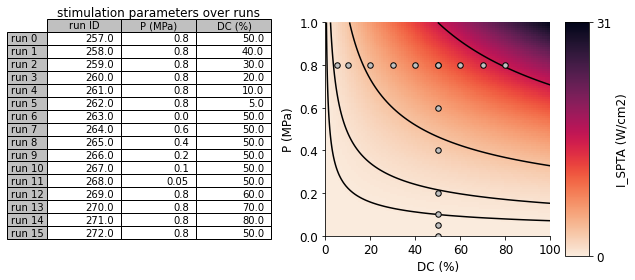

In [25]:
# Get the index dimensions of the fluorescence dataset
index_dims = {k: xtimeseries.index.unique(k) for k in xtimeseries.index.names}

# Create stats dataframes
logger.info('creating statistics dataframe')
stats = pd.DataFrame()

# Add information about pulse and time-average acoustic intensity to info table
output_info_table = add_intensity_to_table(output_info_table)

# Add experimental info to stats
if Label.P not in stats:
    logger.info('adding experimental info to stats...')
    exp_output_table = repeat_along_new_dims(
        output_info_table.drop(Label.NTRIALS, axis=1),
        {k: index_dims[k] for k in [Label.ROI, Label.TRIAL]})
    exp_output_table = exp_output_table.reorder_levels(
        [Label.ROI, Label.RUN, Label.TRIAL]).sort_index()
    stats = pd.concat([exp_output_table, stats], axis=1) 

# Compute sorted Ispta per run
sorted_ISPTAs = (stats[Label.ISPTA]
    .groupby(Label.RUN)
    .first()
    .sort_values()
    .apply('{:.2f} W/cm2'.format)
)

# Add info about discarded trials
logger.info('adding "discarded" labels...')
from constants import ITRIALS_DISCARD
stats[Label.DISCARDED] = False
stats.loc[pd.IndexSlice[:, :, ITRIALS_DISCARD], Label.DISCARDED] = True

# If protocol determined by suffix
if Label.SUFFIX in output_info_table:
    # Plot suffix by run order (as processed by suite2p)
    figs['protocol_summary'] = plot_table(
        output_info_table[[Label.RUNID, Label.SUFFIX]].rename(f'run {{}}'.format) ,
        title='condition over runs', fs=10, aspect=1.5)
else:
    figs['protocol_summary'], axes = plt.subplots(1, 2, figsize=(8, 4))
    # Plot P-DC table by run order (as processed by suite2p)
    plot_table(
        output_info_table[[Label.RUNID, Label.P, Label.DC]].rename(f'run {{}}'.format),
        title='stimulation parameters over runs', 
        ax=axes[0], fs=10, aspect=1.1)
    # Plot P - DC combinations on Ispta map 
    plot_P_DC_map(
        P=output_info_table[Label.P],
        DC=output_info_table[Label.DC],
        dose_key=Label.ISPTA,
        ax=axes[1]
    )
    figs['protocol_summary'].tight_layout()

logger.info('stats table:')
stats

### Visualize population average baseline evolution throughout entire experiment

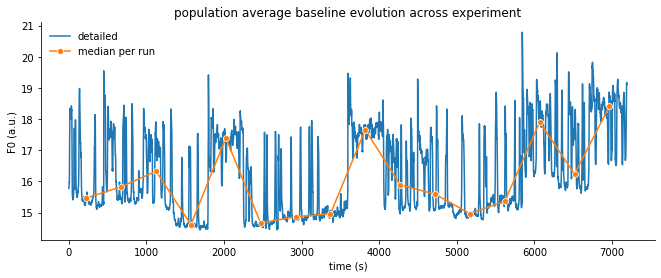

In [26]:
# Add time along entire experiment to population-average dataframe average
popagg_timeseries[Label.TIME] = get_index_along_experiment(
    popagg_timeseries.index, runid_map=output_info_table[Label.RUNID]) / fps

# Plot time evolution of average baseline (with median along each run)
figs['popavg F0 across experiment'], ax = plt.subplots(figsize=(11, 4))
sns.despine(ax=ax)
sns.lineplot(
    data=popagg_timeseries, 
    x=Label.TIME, y=Label.F0, errorbar=None, ax=ax, label='detailed')
sns.lineplot(
    data=popagg_timeseries.groupby(Label.RUN).median(), 
    x=Label.TIME, y=Label.F0, errorbar=None, ax=ax, marker='o', label='median per run')
ax.set_title(f'population average baseline evolution across experiment')
ax.legend(frameon=False)

# Remove time column
del popagg_timeseries[Label.TIME]

### Visualize population-average dynamics across runs

 2023/10/26 15:34:35: computing offsets by run
 2023/10/26 15:34:35: expanding (16 runs) input dataframe to match (16 runs x 16 trials x 100 frames) reference dataframe
 2023/10/26 15:34:35: computing frequency spectra across run...
 2023/10/26 15:34:35: restricting output to frequencies below 0.50 Hz
 2023/10/26 15:34:35: computing offsets by run
 2023/10/26 15:34:35: expanding (16 runs) input dataframe to match (16 runs x 36 freq indexs) reference dataframe
 2023/10/26 15:34:35: adding reference lines at trial-repetition frequency (0.04 Hz)


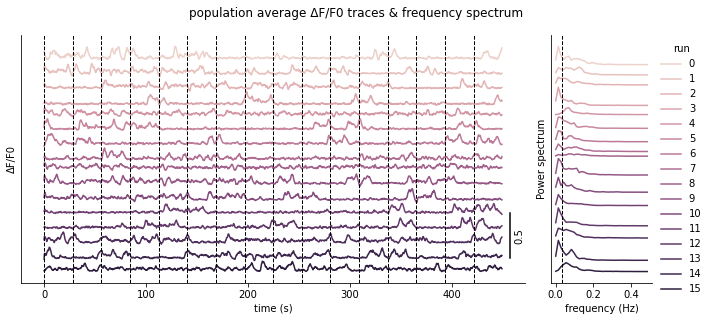

In [27]:
# Define output metrics
ykey = Label.DFF
fmax = .5  # upper frequency limit for specturm graphs

# Create figure
figs['popagg metrics'], axes = plt.subplots(
    1, 2, figsize=(10, 4.5), gridspec_kw=dict(width_ratios=(1, .2)))
# Plot DFF traces for each run, stacked vertically
plot_popagg_timecourse(
    popagg_timeseries, ykey, fps, ax=axes[0], legend=False)
# Plot frequency spectra across runs for this metrics
plot_popagg_frequency_spectrum(
    popagg_timeseries, ykey, fps, fmax=fmax, ax=axes[1])
# Move legend, add title, adjust layout
sns.move_legend(axes[1], 'upper left', bbox_to_anchor=(1, 1), frameon=False)
figs['popagg metrics'].suptitle(f'population average {ykey} traces & frequency spectrum')
figs['popagg metrics'].tight_layout()

# # Visualize associated spectrogram
# figs['popagg_spectrogram'] = plot_spectrogram(
#     popagg_timeseries, ykey, fps, gby=Label.RUN, trialavg=False, nsegpertrial=2, fmax=.3)

### Process background timeseries

 2023/10/26 15:34:37: defining baseline function as 10.0s (37 frames) long adaptive percentile filter
 2023/10/26 15:34:37: computing baseline for background fluorescence (skewness = 0.37)
 2023/10/26 15:34:37: subtracting mean-corrected baseline from background fluorescence signals for each run...
 2023/10/26 15:34:37: computing dFF...
 2023/10/26 15:34:37: normalizing DFF by baseline noise level to obtain z-scores...


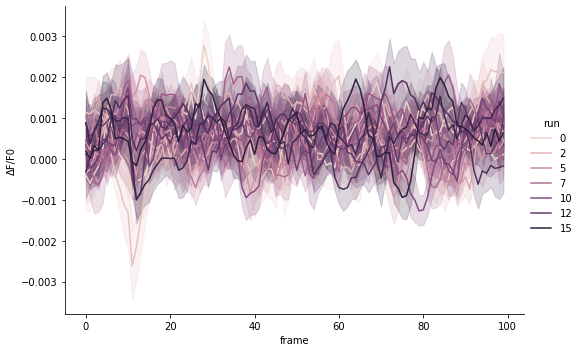

In [28]:
# Separate runs and trials in background fluorescence index
background_timeseries = pd.DataFrame({Label.F: background_F})
idx = background_timeseries.index
irun, iframe = idx // nframes_per_run, np.mod(idx, nframes_per_run)
itrial, iframe = iframe // NFRAMES_PER_TRIAL, np.mod(iframe, NFRAMES_PER_TRIAL)
background_timeseries.index = pd.MultiIndex.from_arrays(
    [irun, itrial, iframe], names=[Label.RUN, Label.TRIAL, Label.FRAME])

# Compute background baseline fluorescence
background_skew = skew(background_F)
background_q = skew_to_quantile(background_skew)
bfunc = get_quantile_baseline_func(
    fps, wquantile=baseline_wquantile, q=baseline_quantile, wsmooth=baseline_wsmoothing)
logger.info(f'computing baseline for background fluorescence (skewness = {background_skew:.2f})')
background_timeseries[Label.F0] = bfunc(background_timeseries[Label.F])

# Apply mean correction to remaining fluorescence and baseline signals
logger.info('subtracting mean-corrected baseline from background fluorescence signals for each run...')
background_F0_mean = background_timeseries[Label.F0].groupby(Label.RUN).mean()
detrender = background_timeseries[Label.F0] - background_F0_mean
background_timeseries[Label.F_DETRENDED] = background_timeseries[Label.F] - detrender
background_timeseries[Label.F0_DETRENDED] = background_timeseries[Label.F0] - detrender

# Compute relative change in fluorescence
logger.info('computing dFF...')
background_timeseries[Label.DFF] = (
    (background_timeseries[Label.F_DETRENDED] - background_timeseries[Label.F0_DETRENDED])
    / background_timeseries[Label.F0_DETRENDED])

# Compute associated z-score
logger.info('normalizing DFF by baseline noise level to obtain z-scores...')
background_dFF_histparams = pd.Series(
    gauss_histogram_fit(background_timeseries[Label.DFF])[1],
    index=['H', 'A', 'x0', 'sigma'])
background_dFF_histparams
background_timeseries[Label.ZSCORE] = (
    (background_timeseries.loc[:, Label.DFF] - background_dFF_histparams['x0']) / background_dFF_histparams['sigma'])

# Plot z-score for all runs
fg = sns.relplot(
    kind='line',
    data=background_timeseries,
    x=Label.FRAME, y=Label.DFF, 
    errorbar='se',
    hue=Label.RUN,
    aspect=1.5,
)

### Inspect time course from specific pixels in baseline run 

 2023/10/26 15:34:40: initializing stack viewer
 2023/10/26 15:34:40: stack size: (25600, 256, 256)
 2023/10/26 15:34:40: extracting frames 0 - 99 from run 6, trial(s) 0 - 15 (indexes = 9600 - 11199)
 2023/10/26 15:34:43: target intensity value based on 10.0-th percentile: 80.44
 2023/10/26 15:34:43: identified 500 pixels with aggregate intensity closest to target
 2023/10/26 15:34:43: target intensity value based on 90.0-th percentile: 92.84
 2023/10/26 15:34:43: identified 500 pixels with aggregate intensity closest to target
 2023/10/26 15:34:43: initializing stack viewer
 2023/10/26 15:34:43: stack size: (25600, 256, 256)
 2023/10/26 15:34:43: extracting frames 0 - 99 from run 6, trial(s) 0 - 15 (indexes = 9600 - 11199)
 2023/10/26 15:34:45: target intensity value based on 10.0-th percentile: 80.44
 2023/10/26 15:34:45: identified 500 pixels with aggregate intensity closest to target
 2023/10/26 15:34:45: target intensity value based on 90.0-th percentile: 92.84
 2023/10/26 15:34:4

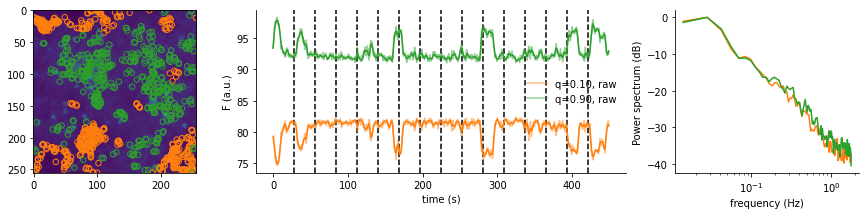

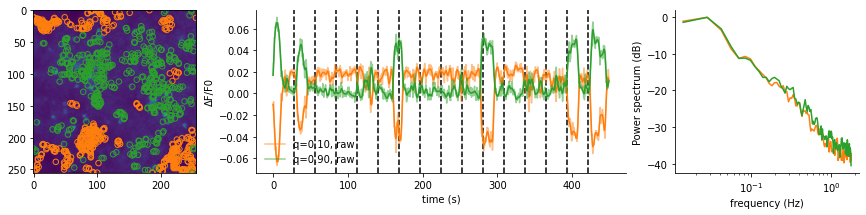

In [29]:
if irun_baseline is not None:
    for yout in ['F', 'dFF']:
        figs[f'reg_pixel_timecourse_{yout}'] = plot_pixel_timecourse(
            s2p_ops, irun=irun_baseline, # filtered_stack_fpaths[irun_baseline], 
            q=[0.1, 0.9], nperq=500, fps=fps, fc=.2, 
            add_spectrum=True, yout=yout, delimiters=i_trialstart_frames_run[1:])

### Visualize ΔF/F traces and ΔF/F heatmaps

 2023/10/26 15:34:48: grouping data by ['run', 'frame'] and averaging...
 2023/10/26 15:34:49: adding time info to table...
 2023/10/26 15:34:49: ΔF/F0: original 1945600-rows series is already rectilinear -> ignoring
 2023/10/26 15:34:49: adding time info to table...
 2023/10/26 15:34:50: plotting ΔF/F0 trial heatmaps...


16it [00:14,  1.13it/s]                        


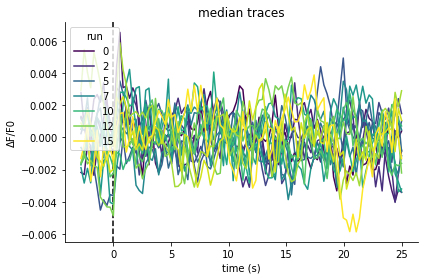

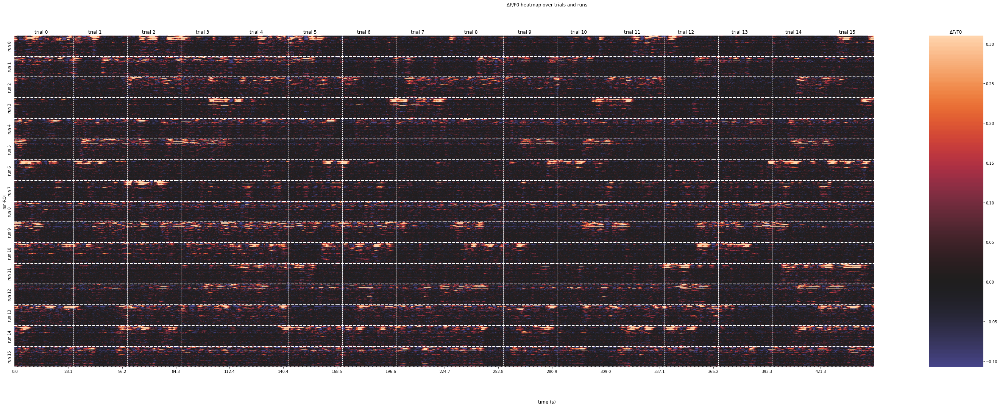

In [30]:
# Aggregate DFF traces per run
figs[f'{Label.DFF} aggregate traces'] = plot_aggregate_traces(
    xtimeseries, fps, Label.DFF, hue=Label.RUN, aggfunc=trial_aggfunc)
# DFF heatmaps over runs & trials, if specified
if plot_rasters:
    fk = f'{Label.DFF} heatmap over trials and runs'
    figs[fk] = plot_activity_heatmap(
        xtimeseries, Label.DFF, fps, col=Label.TRIAL, row=Label.RUN, rasterized=True)
    figs[fk].suptitle(fk);

### Inpsect population activity in baseline run, if any

 2023/10/26 15:35:11: plotting heatmap for baseline run (run 6)
 2023/10/26 15:35:11: sub-indexing data...
 2023/10/26 15:35:11: filtering data...
 2023/10/26 15:35:11: cross-checking filters...
 2023/10/26 15:35:11: ΔF/F0: original 121600-rows series is already rectilinear -> ignoring
 2023/10/26 15:35:11: adding time info to table...
 2023/10/26 15:35:12: plotting ΔF/F0 trial heatmaps...


16it [00:03,  4.14it/s]                        

 2023/10/26 15:35:16: sub-indexing data...
 2023/10/26 15:35:16: filtering data...
 2023/10/26 15:35:16: cross-checking filters...
 2023/10/26 15:35:16: computing Z(ΔF/F0) pairwise correlations between ROIs
 2023/10/26 15:35:16: sub-indexing data...
 2023/10/26 15:35:16: filtering data...
 2023/10/26 15:35:16: cross-checking filters...
 2023/10/26 15:35:16: computing shuffled Z(ΔF/F0) pairwise correlations between ROIs


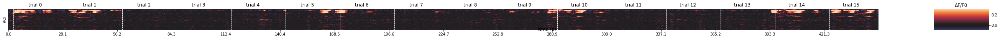

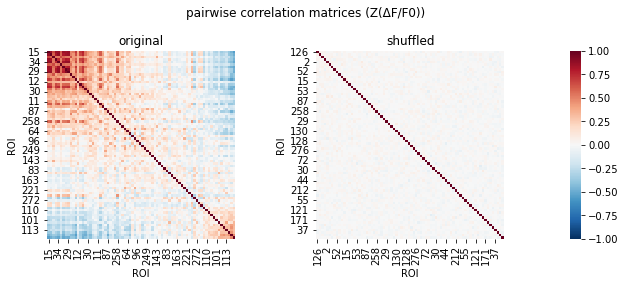

In [31]:
%%skip $has_no_baseline_run

if plot_rasters:
    logger.info(f'plotting heatmap for baseline run (run {irun_baseline})')
    figs['baseline_heatmap'] = plot_activity_heatmap(
        filter_data(xtimeseries, irun=irun_baseline), 
        Label.DFF, fps, col=Label.TRIAL, colwrap=ntrials_per_run, rasterized=True)

# Define output metrics of interest
ykey = Label.ZSCORE

# Compute timeseries correlation matrix for original and shuffled data  
shuffles = {'original': False, 'shuffled': True}
pairwise_corrs = {
    k: get_correlation_matrix(
        filter_data(xtimeseries[ykey], irun=irun_baseline), Label.ROI, sort=True, shuffle=shuffle)
    for k, shuffle in shuffles.items()
}

# Plot correlation matrices
figs['corrcoeff_baseline'], axes = plt.subplots(1, 3, figsize=(9, 4), width_ratios=(1, 1, .05))
for i, (ax, (k, corr)) in enumerate(zip(axes, pairwise_corrs.items())):
    ax.set_title(k)
    sns.heatmap(
        pairwise_corrs[k], ax=ax, 
        cmap='RdBu_r', center=0, vmin=-1, vmax=1,
        cbar=i == 1, cbar_ax=axes[-1] if i == 1 else None,
    )
    ax.set_aspect('equal')
figs['corrcoeff_baseline'].suptitle(f'pairwise correlation matrices ({ykey})')
figs['corrcoeff_baseline'].tight_layout()

# # Compute pairwise optimal correlation lags between ROIs
# pairwise_opt_lags = compute_pairwise_metric(
#     filter_data(xtimeseries[ykey], irun=irun_baseline), 
#     Label.ROI, 
#     optimal_cross_correlation_lag
# )
# pairwise_opt_lags = (pairwise_opt_lags / fps).astype(float)

# # Sort lags matrix by median lag
# idx = pairwise_opt_lags.median().sort_values().index
# pairwise_opt_lags = pairwise_opt_lags.loc[idx, idx]

# # Plot lags matrix correlation between ROIs
# figs['crosscorrlag_baseline'], (mapax, cbar_ax, histax) = plt.subplots(1, 3, figsize=(12, 5), width_ratios=(10, 1, 10))
# sns.heatmap(
#     pairwise_opt_lags, 
#     ax=mapax, 
#     cmap='RdBu_r', center=0, 
#     vmin=-4 / fps, vmax=4 / fps,
#     cbar_ax=cbar_ax,
# )
# mapax.set_title(f'optimal cross-correlation lags ({ykey})')
# cbar_ax.set_title('lag (s)')
# mapax.set_aspect('equal')

# # Plot histogram distribution of pairwise lags
# stacked_pairwise_opt_lags = pairwise_opt_lags.stack()
# lag_bounds = [-20 / fps, 20 / fps]
# stacked_pairwise_opt_lags = stacked_pairwise_opt_lags[stacked_pairwise_opt_lags.between(*lag_bounds)]
# bins = np.arange(lag_bounds[0], lag_bounds[1] + 2 / fps, step=1 / fps) - 1 / (2 * fps)
# sns.histplot(stacked_pairwise_opt_lags, ax=histax, bins=bins)
# sns.despine(ax=histax)
# histax.set_xlabel('lag (s)')
# histax.set_title('cross-correlation opt. lags distribution')

# figs['crosscorrlag_baseline'].tight_layout()

### Analyze oscillatory dynamics

 2023/10/26 15:35:19: extracting Z(ΔF/F0) instantaneous phase with hilbert transform...
 2023/10/26 15:35:20: projecting Z(ΔF/F0) phase (rad) onto unit circle
 2023/10/26 15:35:20: computing inter-ROI Z(ΔF/F0) phase (rad) clustering
 2023/10/26 15:35:20: projecting Z(ΔF/F0) phase (rad) onto unit circle
 2023/10/26 15:35:21: computing inter-trial Z(ΔF/F0) phase (rad) clustering
 2023/10/26 15:35:21: adding time info to table...
 2023/10/26 15:35:21: adding time info to table...
 2023/10/26 15:35:21: expanding (16 runs) input dataframe to match (76 ROIs x 16 runs x 100 frames) reference dataframe
 2023/10/26 15:35:21: expanding (16 runs) input dataframe to match (16 runs x 16 trials x 100 frames) reference dataframe


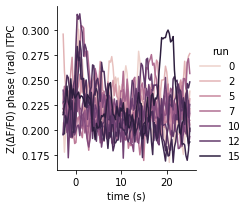

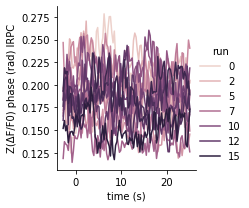

In [32]:
# Define output metrics from which to extract oscillation information
ykey = Label.ZSCORE

# Apply hilbert transform to extract instantaneous oscillation phase 
logger.info(f'extracting {ykey} instantaneous phase with hilbert transform...')
hilbert_phase = (xtimeseries[ykey]
    .groupby([Label.ROI, Label.RUN])
    .transform(lambda s: np.angle(hilbert(s)))
    .rename(f'{ykey} {Label.PHASE}')
)

# Compute inter-ROI phase clustering (IRPC) from phase timecourse
irpc = phase_clustering(hilbert_phase, Label.ROI).to_frame()

# Compute inter-trial phase clustering (ITPC) from phase timecourse
itpc = phase_clustering(hilbert_phase, Label.TRIAL).to_frame()

# Add time and run params info to phase clustering tables
itpc = add_time_to_table(itpc, fps=fps)
irpc = add_time_to_table(irpc, fps=fps)
free_expand_and_add(
    output_info_table[[Label.P, Label.DC, Label.ISPTA]], itpc)
free_expand_and_add(
    output_info_table[[Label.P, Label.DC, Label.ISPTA]], irpc)

# Plotphase clustering time course per condition
for pc in [itpc, irpc]: 
    sns.relplot(
        kind='line',
        data=pc.reset_index(),
        x=Label.TIME,
        y=pc.columns[1],
        hue=Label.RUN,
        errorbar=None,
        height=3, 
    )

### Compute average pre-and post-stim values, as well as stim-evoked change, for both ΔF/F and z-score 

In [33]:
# Shuffle population-average data, per ROI and condition
logger.info('shuffling timeseries for each ROI and condition...')
shuffled_xtimeseries = (xtimeseries
    .groupby([Label.ROI, Label.RUN])
    .transform(shuffle)
)

# For each variable of interest
for ykey in [Label.DFF, Label.ZSCORE]:
    # Compute pre- and post-stimulus average, and their difference
    ystats = compute_evoked_change(xtimeseries, ykey, full_output=True)
    # Repeat for shuffled data
    shuffled_ystats = compute_evoked_change(shuffled_xtimeseries, ykey, full_output=True)
    # Add both to stats dataframe
    for k in ystats:
        stats[k] = ystats[k]
        stats[f'shuffled {k}'] = shuffled_ystats[k]

 2023/10/26 15:35:25: shuffling timeseries for each ROI and condition...
 2023/10/26 15:35:27: applying mean function on ΔF/F0 in [5-10] index window across ROI, run, trial ...
 2023/10/26 15:35:27: applying mean function on ΔF/F0 in [11-21] index window across ROI, run, trial ...
 2023/10/26 15:35:27: computing evoked ΔF/F0 change...
 2023/10/26 15:35:27: applying mean function on ΔF/F0 in [5-10] index window across ROI, run, trial ...
 2023/10/26 15:35:27: applying mean function on ΔF/F0 in [11-21] index window across ROI, run, trial ...
 2023/10/26 15:35:27: computing evoked ΔF/F0 change...
 2023/10/26 15:35:27: applying mean function on Z(ΔF/F0) in [5-10] index window across ROI, run, trial ...
 2023/10/26 15:35:27: applying mean function on Z(ΔF/F0) in [11-21] index window across ROI, run, trial ...
 2023/10/26 15:35:27: computing evoked Z(ΔF/F0) change...
 2023/10/26 15:35:27: applying mean function on Z(ΔF/F0) in [5-10] index window across ROI, run, trial ...
 2023/10/26 15:35:2

### Plot stimulus-evoked ΔF/F changes

 2023/10/26 15:38:56: aggregating trial data over ROI, run


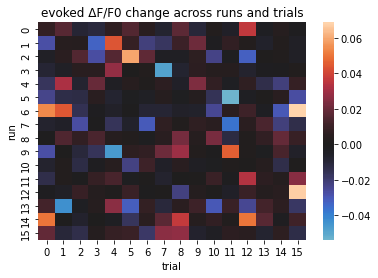

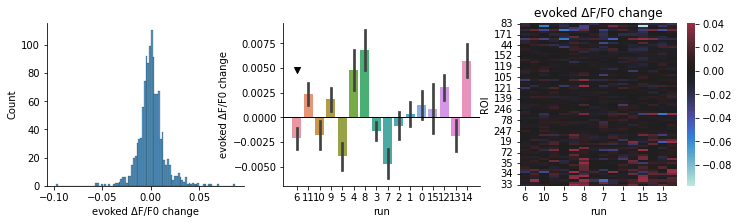

In [36]:
ykey_diff = get_change_key(Label.DFF)
# Plot heatmap of average evoked DFF change across runs & trials
runseq = stats[Label.RUNID].groupby(Label.RUN).first().sort_values().index
figs[f'{ykey_diff} map'] = plot_stat_heatmap(
    stats, ykey_diff, run_order=runseq)
# Plot evoked change graphs
figs[f'{ykey_diff} graphs'] = plot_stat_graphs(
    get_trial_aggregated(stats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Inspect state-dependence of evoked activity

 2023/10/26 15:39:03: splitting data by I_SPTA (W/cm2)...
 2023/10/26 15:39:03: rendering hist-plot of evoked Z(ΔF/F0) change vs. pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:06: computing correlation coefficients of evoked Z(ΔF/F0) change vs. pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:06: computing linear regression of evoked Z(ΔF/F0) change vs. pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:06: splitting data by I_SPTA (W/cm2)...
 2023/10/26 15:39:06: rendering hist-plot of shuffled evoked Z(ΔF/F0) change vs. shuffled pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:09: computing correlation coefficients of shuffled evoked Z(ΔF/F0) change vs. shuffled pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:09: computing linear regression of shuffled evoked Z(ΔF/F0) change vs. shuffled pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:09: computing correlation coefficients between evoked Z(ΔF/F0) change vs pre-stim avg Z(ΔF/F0)...
 2023/10/26 15:39:10: computing linear regression on pre-stim avg Z(ΔF/F0) and evoked 

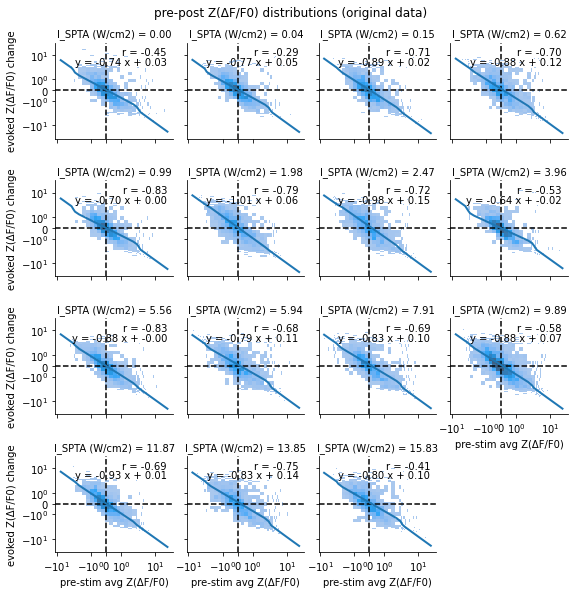

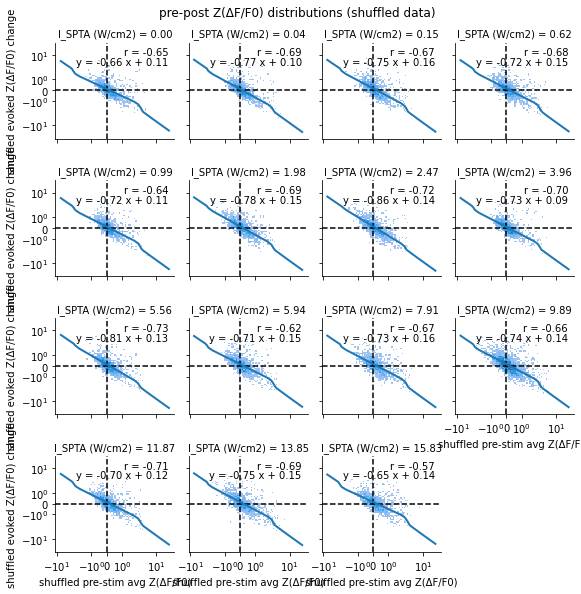

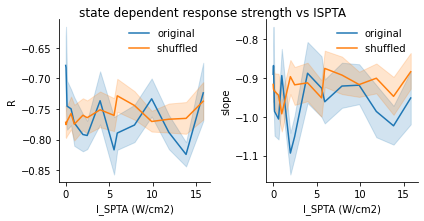

In [37]:
# Define variable of interest
ykey = Label.ZSCORE

# For both original and shuffled data
tmpaxes = []
for prefix in ['', 'shuffled ']:
    # Plot pre-post distribution and associated statistics
    figs[f'prepost corr{prefix}'] = plot_prepost_correlation(
        stats, 
        ykey, 
        splitby=Label.ISPTA,
        addreg=True,
        prefix=prefix,
    )
    figs[f'prepost corr{prefix}'].suptitle(
        f'pre-post {ykey} distributions ({prefix if prefix else "original "}data)', y=1.02)
    # Add axes to list
    tmpaxes = tmpaxes + figs[f'prepost corr{prefix}'].axes

# Harmonize axes limits
harmonize_axes_limits(tmpaxes, axkey='xy')

# Extract keys for pre-stimulus average and change
y_prestim_avg, _, y_change = get_change_key(ykey, full_output=True)

# Determine grouping categories
gby = [Label.ISPTA, Label.ROI]

# Create figure
outkeys = ['R', 'slope']
fig, axes = plt.subplots(1, len(outkeys), figsize=(3 * len(outkeys), 3))

# For original and shuffled data
for prefix in ['', 'shuffled ']:
    # Extract keys for pre-stimulus average and change
    xykeys = [f'{prefix}{y}' for y in [y_prestim_avg, y_change]]

    # Compute Pearson correlation coefficient between pre-stimulus average and change
    logger.info(f'computing correlation coefficients between {xykeys[1]} vs {xykeys[0]}...')
    corrcoeffs = (stats
        .groupby(gby)
        [xykeys]
        .corr()
        .droplevel(-1)
        .iloc[::2, 1]
        .rename('R')
    )

    # Compute linear regression on pre-stimulus average and change
    logger.info(f'computing linear regression on {y_prestim_avg} and {y_change}...')
    regres = (stats
        .groupby(gby)
        [xykeys]
        .apply(lambda df: apply_linregress(
            df, xkey=xykeys[0], ykey=xykeys[1], robust=True))
    )

    # Plot results vs ISPTA
    logger.info('plotting results vs ISPTA...')
    statedep_data = pd.concat([regres, corrcoeffs], axis=1)
    for (ax, k) in zip(axes, outkeys):
        sns.despine(ax=ax)
        sns.lineplot(
            ax=ax,
            data=statedep_data,
            x=Label.ISPTA,
            y=k,
            label=prefix if prefix else 'original'
        )

for ax in axes:
    ax.legend(frameon=False)

# Adjust layout and add title
fig.tight_layout()
fig.suptitle('state dependent response strength vs ISPTA', y=1.01)

# Add figure to output dict
figs['prepost vs ISPTA'] = fig

### Identify & reject trials with significant stimulus-evoked motion artefact

 2023/10/26 15:42:51: computing diplacement velocity over time from registration offsets...
 2023/10/26 15:42:51: correcting displacement velocity at indices [1, 10] to compensate for frames substitution...
 2023/10/26 15:42:53: identified 8 / 256 trials (3.1%) with abnormal peak or average displacement velocities
 2023/10/26 15:42:53: identified 1824/19456 (9.4%) samples with [discarded, motion] tags
 2023/10/26 15:42:53: identifying conditions with >= 5 valid trials
 2023/10/26 15:42:53: identified 1824/19456 (9.4%) samples with [discarded, motion] tags
 2023/10/26 15:42:53: identifying conditions with >= 5 valid trials
 2023/10/26 15:42:53: adding expanded validity index to timeseries ...
 2023/10/26 15:42:54: filtering timeseries ...
 2023/10/26 15:42:58: grouping data by ['motion', 'frame'] and averaging...
 2023/10/26 15:42:58: adding time info to table...
 2023/10/26 15:42:58: grouping data by ['run', 'frame'] and averaging...
 2023/10/26 15:42:58: adding time info to table...
 

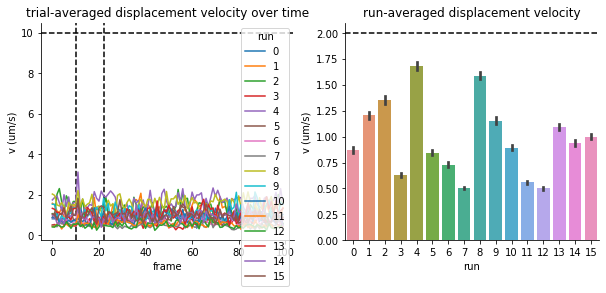

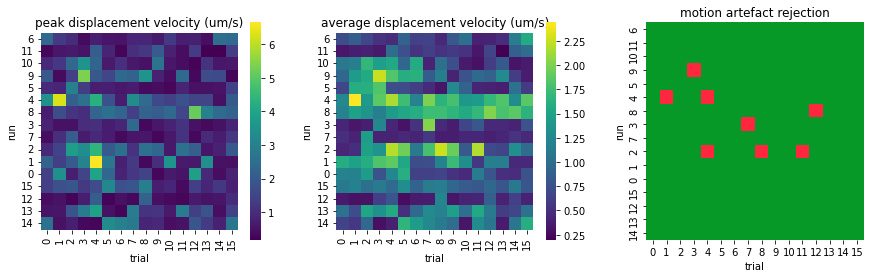

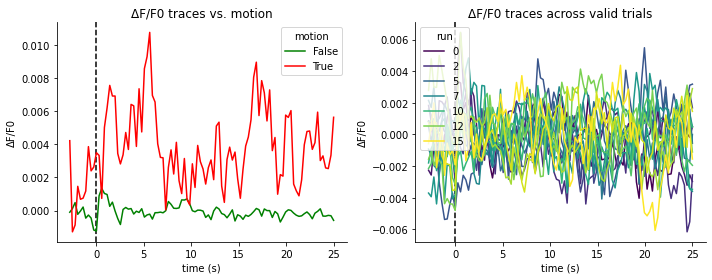

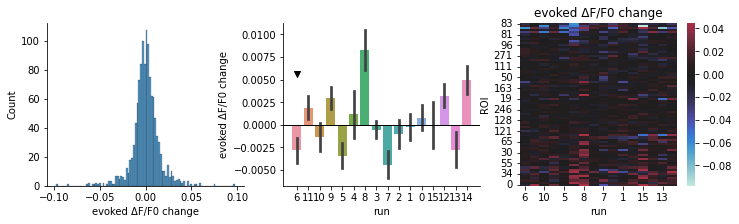

In [43]:
from constants import VDISP_PEAK_THR, VDISP_AVG_THR

# Create (run, trial, frame) multi-index
exp_mux_keys = [Label.RUN, Label.TRIAL, Label.FRAME]
exp_mux = pd.MultiIndex.from_product(
    [index_dims[k] for k in exp_mux_keys], names=exp_mux_keys)

# Compute displacement velocity profiles
if isinstance(ss, StackSubstitutor):
    isubs = [max(x[:2]) for x in ss.submap if abs(x[0] - x[1]) == 1]
else:
    isubs = None
vdisp = compute_displacement_velocity(s2p_ops, exp_mux, um_per_px, fps, isubs=isubs)

# Plot average displacement velocity profile for each run
figs['vdisp_profiles'], axes = plt.subplots(1, 2, figsize=(10, 4))
for ax in axes:
    sns.despine(ax=ax)
ax = axes[0]
ax.set_title('trial-averaged displacement velocity over time')
for idx in [FrameIndex.STIM, FrameIndex.RESPONSE.stop]:
    ax.axvline(idx, c='k', ls='--')
sns.lineplot(
    data=vdisp.to_frame(), x=Label.FRAME, y=vdisp.name, ax=ax,
    hue=Label.RUN, errorbar=None, palette='tab10')
ax.axhline(VDISP_PEAK_THR, ls='--', c='k')
ax = axes[1]
ax.set_title('run-averaged displacement velocity')
sns.barplot(
    data=vdisp.to_frame().reset_index(Label.RUN), 
    x=Label.RUN, y=vdisp.name, ax=ax, errorbar='se')
ax.axhline(VDISP_AVG_THR, ls='--', c='k')

# Compute peak of displacement velocity within response window for each run and trial
# and assess if motion exceeded threshold
vdisp_window = vdisp.loc[pd.IndexSlice[:, :, FrameIndex.RESPONSE]]
vdisp_metrics = vdisp_window.groupby([Label.RUN, Label.TRIAL]).agg(
    find_response_peak).rename(Label.PEAK_DISP_VEL).to_frame()
vdisp_metrics[Label.MOTION] = vdisp_metrics[Label.PEAK_DISP_VEL] > VDISP_PEAK_THR

# Compute average of displacement velocity across trial interval for each run and trial
# and assess if motion exceeded threshold
vdisp_metrics[Label.AVG_DISP_VEL] = vdisp.groupby([Label.RUN, Label.TRIAL]).mean()
vdisp_metrics[Label.MOTION] = np.logical_or(
    vdisp_metrics[Label.MOTION],
    vdisp_metrics[Label.AVG_DISP_VEL] > VDISP_AVG_THR)

# Add displacement velocity metrics and motion status info to stats
exp_vdisp_metrics = repeat_along_new_dim(
    vdisp_metrics, Label.ROI, stats.index.unique(Label.ROI)
    ).swaplevel(0, 2).swaplevel(1, 2).sort_index()
for k in exp_vdisp_metrics:
    stats[k] = exp_vdisp_metrics[k]

# Add stimulus parameters info to vdisp metrics dataframe
vdisp_metrics = pd.concat([vdisp_metrics, repeat_along_new_dim(
    output_info_table[[Label.P, Label.DC, Label.ISPTA]],
    Label.TRIAL, exp_mux.unique(level=Label.TRIAL))], axis=1)

if Label.SUFFIX is None:
    # Plot dependency of motion artefact on pressure & duty cycle 
    figs['vdispmetrics_vs_stimparams'], axes = plt.subplots(2, 3, figsize=(12, 8))
    figs['vdispmetrics_vs_stimparams'].suptitle('dependency of motion artefact on stimulus parameters')
    for axrow, ykey, vcrit in zip(axes, [Label.PEAK_DISP_VEL, Label.AVG_DISP_VEL], [VDISP_PEAK_THR, VDISP_AVG_THR]):
        for ax, xkey in zip(axrow, [Label.P, Label.DC]):
            sns.lineplot(
                data=get_xdep_data(vdisp_metrics, xkey), x=xkey, y=ykey, ax=ax)
        sns.lineplot(data=vdisp_metrics, x=Label.ISPTA, y=ykey, ax=axrow[-1])
        for ax in axrow:
            sns.despine(ax=ax)
            ax.axhline(vcrit, ls='--', c='k')
            ax.set_ylim(0, ax.get_ylim()[1])

# Plot peak and average displacement velocities and motion artefact rejection heatmaps
figs['vdispmetrics_motionreject_maps'], axes = plt.subplots(1, 3, figsize=(15, 4))
for ax in axes:
    ax.set_aspect(1.)
ax = axes[0]
ax.set_title(Label.PEAK_DISP_VEL)
sns.heatmap(
    vdisp_metrics[Label.PEAK_DISP_VEL].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=nan_viridis)
ax = axes[1]
ax.set_title(Label.AVG_DISP_VEL)
sns.heatmap(
    vdisp_metrics[Label.AVG_DISP_VEL].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=nan_viridis)
ax = axes[2]
ax.set_title('motion artefact rejection')
sns.heatmap(
    vdisp_metrics[Label.MOTION].unstack().reindex(
        sorted_ISPTAs.index.values, axis=0),
    ax=ax, cmap=rdgn, cbar=False)

# Log identified motion trials
nmotion = vdisp_metrics[Label.MOTION].sum()
ntot = len(vdisp_metrics)
logger.info(
    f'identified {nmotion} / {ntot} trials ({nmotion / ntot * 1e2:.1f}%)'
    f' with abnormal peak or average displacement velocities')

# Compute new valid stats & timeseries
vstats = valid(stats)
vtimeseries = valid_timeseries(xtimeseries, stats)

# Plot DFF traces for both categories, and valid across runs
figs[f'{Label.DFF} motion filtering'], axes = plt.subplots(1, 2, figsize=(10, 4))
plot_aggregate_traces(
    expand_and_add(stats[Label.MOTION].to_frame(), xtimeseries.copy()),
    fps, Label.DFF, hue=Label.MOTION, cmap={True: 'r', False: 'g'}, ax=axes[0],
    aggfunc=trial_aggfunc)
axes[0].set_title(f'{Label.DFF} traces vs. motion')
plot_aggregate_traces(
    vtimeseries, fps, Label.DFF, hue=Label.RUN, ax=axes[1],
    aggfunc=trial_aggfunc)
axes[1].set_title(f'{Label.DFF} traces across valid trials')

# Plot evoked change graphs
figs[f'{ykey_diff} motion filtering'] = plot_stat_graphs(
    get_trial_aggregated(vstats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Detect activity over valid trials and compute event rate

 2023/10/26 15:55:25: detecting activity events in Z(ΔF/F0) signals: 
    - min distance = 7 indexes
    - min Z(ΔF/F0) height = 1.64
 2023/10/26 15:55:25: grouping events over trials
 2023/10/26 15:55:26: counting events for each frame index...
 2023/10/26 15:55:26: multiplying by frame rate and normalizing by # trials per run to get event rate...
 2023/10/26 15:55:26: smoothing event rates with 5 frames (1.40 s) moving average...
 2023/10/26 15:55:27: adding time info to table...
 2023/10/26 15:55:27: grouping data by ['run', 'frame'] and averaging...
 2023/10/26 15:55:27: adding time info to table...


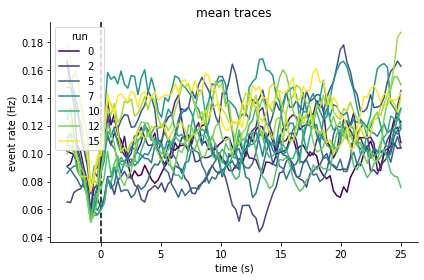

In [60]:
# Detect activity events on z-scored signals
from constants import MIN_EVENTS_DISTANCE
idistance = int(np.round(MIN_EVENTS_DISTANCE * fps))  # minimum distance between peaks (indexes)
height = pvalue_to_zscore(PTHR_DETECTION, directional=directional)  # minimum peak height
evts_params = [
    f'min distance = {idistance} indexes',
    f'min {Label.ZSCORE} height = {height:.2f}']
peaksstr = '\n'.join(f'    - {x}' for x in evts_params)
logger.info(f'detecting activity events in {Label.ZSCORE} signals: \n{peaksstr}')
idx_events = vtimeseries[Label.ZSCORE].groupby([Label.ROI, Label.RUN]).apply(
    lambda s: find_peaks(s.values, height=height, distance=idistance)[0]).rename('event idxs')

# Aggregate event indexes over trials
logger.info('grouping events over trials')
idx_events_agg = idx_events.groupby([Label.ROI, Label.RUN]).transform(
    lambda x: np.mod(x, NFRAMES_PER_TRIAL))

# Count number of events for each frame index
logger.info('counting events for each frame index...')
bins = np.arange(0, NFRAMES_PER_TRIAL + 0.5) - 0.5
nevents = idx_events_agg.apply(
    lambda s: np.histogram(s, bins)[0]).rename('# events').explode()
midpts = (bins[:-1] + bins[1:]) / 2
nreps = nevents.index.nunique()
exp_midpts = np.tile(midpts, (nreps, 1)).ravel()
nevents = nevents.to_frame()
nevents[Label.FRAME] = exp_midpts.astype(int)
nevents.set_index(Label.FRAME, append=True, inplace=True)
nevents = nevents['# events']

# Multiply by frame rate and normalize by number of trials to get event rate
logger.info(
    'multiplying by frame rate and normalizing by # trials per run to get event rate...')
trial_count = vtimeseries[Label.DFF].groupby(
    [Label.ROI, Label.RUN, Label.TRIAL]).first().groupby([Label.ROI, Label.RUN]).count()
event_rates = (nevents * fps / trial_count).rename(Label.EVENT_RATE)

# Apply moving average to smooth event rate profiles
from constants import EVENTS_BIN_INTERVAL
if EVENTS_BIN_INTERVAL is not None:
    wlen = int(np.round(EVENTS_BIN_INTERVAL * fps))
    if wlen % 2 == 0:
        wlen += 1
    wtime = wlen / fps
    logger.info(f'smoothing event rates with {wlen} frames ({wtime:.2f} s) moving average...')
    event_rates = event_rates.groupby([Label.ROI, Label.RUN]).transform(
        lambda s: apply_rolling_window(s.values, wlen))

# Visualize event rate traces per run
figs[f'{Label.EVENT_RATE} aggregate traces valid'] = plot_aggregate_traces(
    add_time_to_table(event_rates.to_frame(), fps=fps), 
    fps, Label.EVENT_RATE, hue=Label.RUN,
    aggfunc='mean')

### Identify & reject trials with pre-stimulus activity and/or "inhibition"

 2023/10/26 17:36:30: analyzing Z(ΔF/F0) relative pre-stimulus levels...
 2023/10/26 17:36:30: setting pre-stimulus Z(ΔF/F0) absolute outlier threshold to 3000.000
 2023/10/26 17:36:30: identified:
   - 0/19456 trials (0.00%) significant pre-stimulus activity
   - 0/19456 trials (0.00%) significant pre-stimulus inhibition
   - 0/19456 trials (0.00%) pre-stimulus outlier data
 2023/10/26 17:36:30: identified 0/256 trials (0.0%) with more than 50.0 % pre-active cells
 2023/10/26 17:36:31: identified 1824/19456 (9.4%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2023/10/26 17:36:31: identifying conditions with >= 5 valid trials
 2023/10/26 17:36:31: identified 1824/19456 (9.4%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2023/10/26 17:36:31: identifying conditions with >= 5 valid trials
 2023/10/26 17:36:31: adding expanded validity ind

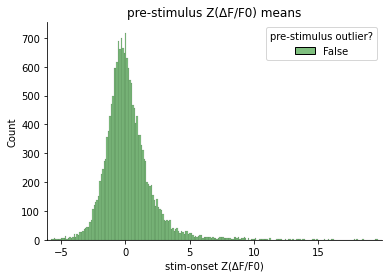

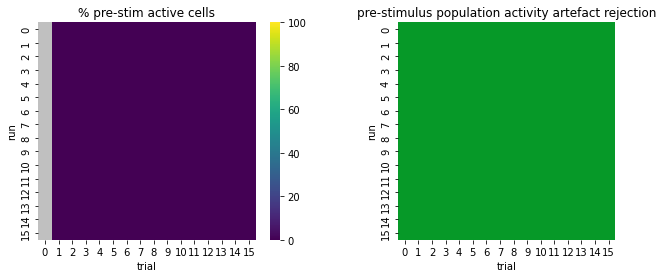

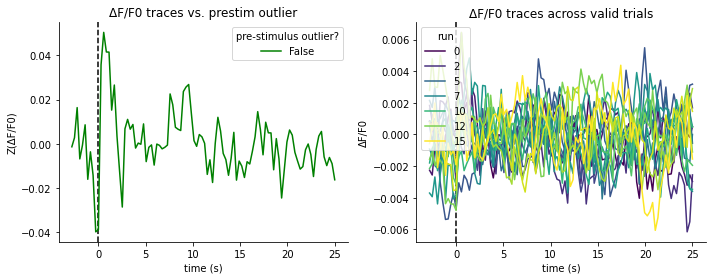

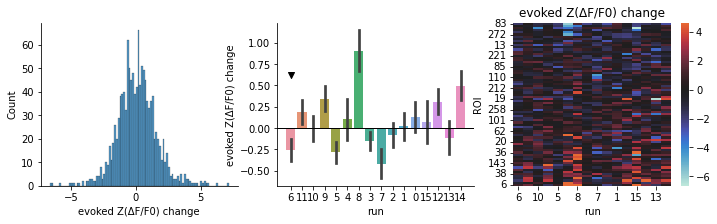

In [114]:
# Compute mean z-score in pre-stimulus window for each trial
logger.info(f'analyzing {Label.ZSCORE} relative pre-stimulus levels...')
from constants import ZTHR_REJECTION
zprestim_key = get_change_key(Label.ZSCORE, full_output=True)[0]
z_prestim_thr = ZTHR_REJECTION
# z_prestim_thr = get_zscore_mean(PTHR_REJECTION, FrameIndex.PRESTIM)
# zprestim_key = f'stim-onset {Label.ZSCORE}'
# z_prestim_thr = pvalue_to_zscore(PTHR_REJECTION, directional=False)
# stats[zprestim_key] = (xtimeseries
#     .loc[slice_last_dim(xtimeseries.index, FrameIndex.STIM), Label.ZSCORE]
#     .droplevel(Label.FRAME)
# )

# Classify pre-stimulus state on a per-ROI basis for each trial
logger.info(
    f'setting pre-stimulus {Label.ZSCORE} absolute outlier threshold to {z_prestim_thr:.3f}')
stats[Label.PRESTIM_ACTIVITY] = stats[zprestim_key] > z_prestim_thr
stats[Label.PRESTIM_INHIBITION] = stats[zprestim_key] < -z_prestim_thr
stats[Label.PRESTIM_OUTLIER] = stats[[
        Label.PRESTIM_INHIBITION,
        Label.PRESTIM_ACTIVITY, 
    ]].any(axis=1)
npreacts = stats[Label.PRESTIM_ACTIVITY].sum()
npreinhibs = stats[Label.PRESTIM_INHIBITION].sum()
npreoutliers = stats[Label.PRESTIM_OUTLIER].sum()
ntot = len(stats)
outlierslog = [
    (stats[Label.PRESTIM_ACTIVITY].sum(), 'significant pre-stimulus activity'),
    (stats[Label.PRESTIM_INHIBITION].sum(), 'significant pre-stimulus inhibition'),
    (stats[Label.PRESTIM_OUTLIER].sum(), 'pre-stimulus outlier data')
]
outlierslog = '\n'.join([
    f'   - {n}/{ntot} trials ({n / ntot * 100:.2f}%) {k}' for n, k in outlierslog])
logger.info(f'identified:\n{outlierslog}')

# Plot histogram of pre-stimulus means
figs['prestim means dist'], ax = plt.subplots()
ax.set_title(f'pre-stimulus {Label.ZSCORE} means')
sns.despine(ax=ax)
sns.histplot(
    data=stats, x=zprestim_key, ax=ax, bins=400,
    hue=Label.PRESTIM_OUTLIER, palette={True: 'r', False: 'g'})
for z in [
        -z_prestim_thr,
        z_prestim_thr
    ]:
    ax.axvline(z, c='k', ls='--')
ax.set_xlim(stats[zprestim_key].quantile(.001), stats[zprestim_key].quantile(.999))

# Compute fraction of ROIs with pre-stimulus activity for each run & trial
nROIs = len(stats.index.unique(level=Label.ROI))
npreacts_per_run_trial = stats.loc[:, Label.PRESTIM_ACTIVITY].groupby(
    [Label.RUN, Label.TRIAL]).sum()
isdiscarded = stats[Label.DISCARDED].groupby([Label.RUN, Label.TRIAL]).first()
npreacts_per_run_trial.loc[isdiscarded[isdiscarded].index] = np.nan
pct_preacts_per_run_trial = (npreacts_per_run_trial / nROIs * 1e2).rename(Label.PCT_PREACTIVE_CELLS)

# Label trials with large fraction of pre-active cells
from constants import PCT_PREACTIVE_THR
pop_preact_per_run_trial = (pct_preacts_per_run_trial > PCT_PREACTIVE_THR).rename(
    Label.PRESTIM_POP_ACTIVITY)
npreacts_pop, ntot = pop_preact_per_run_trial.sum(), len(pop_preact_per_run_trial)
logger.info(
    f'identified {npreacts_pop}/{ntot} trials ({npreacts_pop / ntot * 100:.1f}%)'
    f' with more than {PCT_PREACTIVE_THR} % pre-active cells')
exp_pop_preact_per_run_trial = repeat_along_new_dim(
    pop_preact_per_run_trial.to_frame(),
    Label.ROI, stats.index.unique(level=Label.ROI)).reorder_levels(
    [Label.ROI, Label.RUN, Label.TRIAL]).sort_index()
stats[Label.PRESTIM_POP_ACTIVITY] = exp_pop_preact_per_run_trial

# Plot pre-stimulus population activity rejection heatmap
figs['prestim active & reject maps'], axes = plt.subplots(1, 2, figsize=(11, 4))
for ax in axes:
    ax.set_aspect(1.)
ax = axes[0]
ax.set_title(Label.PCT_PREACTIVE_CELLS)
sns.heatmap(pct_preacts_per_run_trial.unstack(), ax=ax, vmin=0, vmax=100, cmap=nan_viridis)
ax = axes[1]
ax.set_title('pre-stimulus population activity artefact rejection')
sns.heatmap(pop_preact_per_run_trial.unstack(), ax=ax, cmap=rdgn, cbar=False)

# Compute new valid stats & timeseries
vstats = valid(stats)
vtimeseries = valid_timeseries(xtimeseries, stats)

# Plot DFF traces for both categories, and valid across runs
figs[f'{Label.DFF} prestim filtering'], axes = plt.subplots(1, 2, figsize=(10, 4))
plot_aggregate_traces(
    expand_and_add(stats[Label.PRESTIM_OUTLIER].to_frame(), xtimeseries.copy()),
    fps, Label.ZSCORE, hue=Label.PRESTIM_OUTLIER, cmap={True: 'r', False: 'g'}, ax=axes[0],
    aggfunc=trial_aggfunc)
axes[0].set_title(f'{Label.DFF} traces vs. prestim outlier')
plot_aggregate_traces(
    vtimeseries, fps, Label.DFF, hue=Label.RUN, ax=axes[1],
    aggfunc=trial_aggfunc)
axes[1].set_title(f'{Label.DFF} traces across valid trials')

# Plot evoked change graphs
figs[f'{ykey_diff} prestim filtering'] = plot_stat_graphs(
    get_trial_aggregated(vstats[[ykey_diff]], aggfunc=trial_aggfunc), 
    ykey_diff, run_order=sorted_ISPTAs, irun_marker=irun_P0)

### Inspect impact of exclusion criteria on trial-averaged activity

 2023/10/26 17:37:36: plotting % of excluded samples per ROI, across criteria
 2023/10/26 17:37:37: identifying conditions with >= 5 valid trials
 2023/10/26 17:37:37: adding expanded validity index to timeseries ...
 2023/10/26 17:37:38: filtering timeseries ...
 2023/10/26 17:37:43: identified 1216/19456 (6.2%) samples with "discarded" tag
 2023/10/26 17:37:43: identifying conditions with >= 5 valid trials
 2023/10/26 17:37:43: adding expanded validity index to timeseries ...
 2023/10/26 17:37:44: filtering timeseries ...
 2023/10/26 17:37:49: identified 608/19456 (3.1%) samples with "motion" tag
 2023/10/26 17:37:49: identifying conditions with >= 5 valid trials
 2023/10/26 17:37:49: adding expanded validity index to timeseries ...
 2023/10/26 17:37:50: filtering timeseries ...
 2023/10/26 17:37:55: identified 0/19456 (0.0%) samples with "pre-stim cell activity?" tag
 2023/10/26 17:37:55: identifying conditions with >= 5 valid trials
 2023/10/26 17:37:55: adding expanded validity in

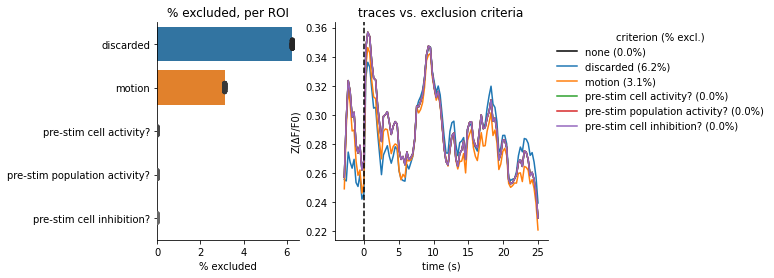

In [115]:
# Plot pct of exclusion per criterion and traces vs exclusion criteria
figs['impact of exclusion criteria'], axes = plt.subplots(
    1, 2, figsize=(7, 4), width_ratios=[1, 1.5])
plot_pct_excluded(stats, ax=axes[0]);
plot_traces_vs_exclusion(xtimeseries, stats, Label.ZSCORE, ax=axes[1]);

### Visualize number of valid trials per ROI & condition, and number of valid conditions per ROI 

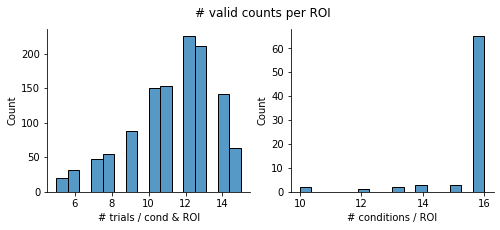

In [56]:
ntrials_per_cond = (
    vstats.iloc[:, 0]
    .groupby([Label.ROI, Label.RUN])
    .count()
    .rename('# trials / cond & ROI')
)
nconds_per_ROI = (
    ntrials_per_cond
    .groupby(Label.ROI)
    .count()
    .rename('# conditions / ROI')
)
figs['valid_counts'], axes = plt.subplots(1, 2, figsize=(8, 3))
figs['valid_counts'].suptitle('# valid counts per ROI')
for ax in axes:
    sns.despine(ax=ax)
sns.histplot(ntrials_per_cond, ax=axes[0], bins=nruns)
sns.histplot(nconds_per_ROI, ax=axes[1], bins=ntrials_per_run);

### Visualize curated ΔF/F traces and heatmaps

 2023/10/26 15:44:38: grouping data by ['run', 'frame'] and averaging...
 2023/10/26 15:44:38: adding time info to table...
 2023/10/26 15:44:38: ΔF/F0: expanding 1339800-rows series into 76 ROIs x 16 runs x 15 trials x 100 frames (1824000-rows) series (484200 additional rows)
 2023/10/26 15:44:40: adding time info to table...
 2023/10/26 15:44:42: plotting ΔF/F0 trial heatmaps...


15it [00:12,  1.22it/s]                        


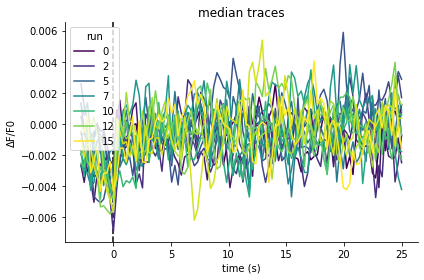

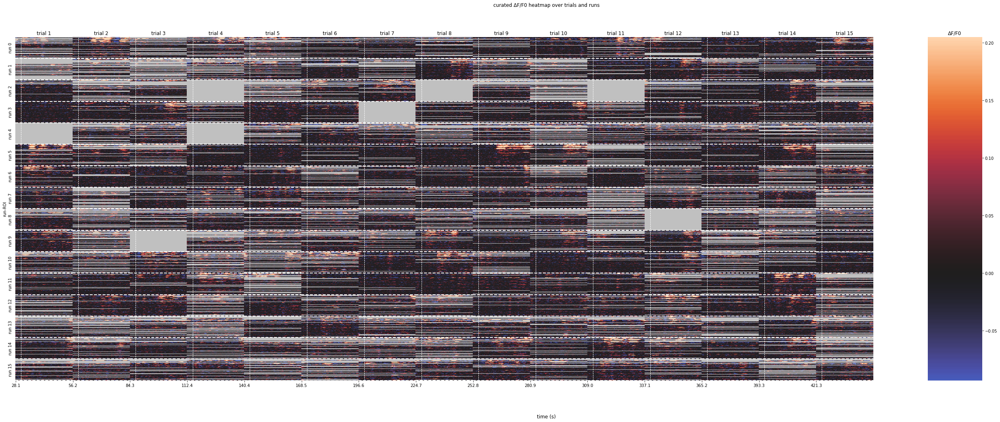

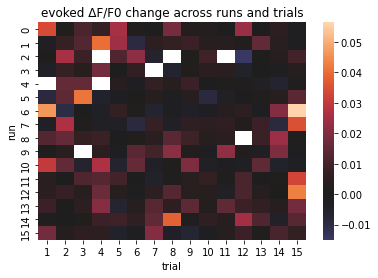

In [46]:
# Aggregate DFF traces per run
figs[f'curated {Label.DFF} aggregate traces'] = plot_aggregate_traces(
    vtimeseries, fps, Label.DFF, hue=Label.RUN,
    aggfunc=trial_aggfunc)
# DFF heatmaps over runs & trials
if plot_rasters:
    fk = f'curated {Label.DFF} heatmap over trials and runs'
    figs[fk] = plot_activity_heatmap(
        vtimeseries, Label.DFF, fps, col=Label.TRIAL, row=Label.RUN, rasterized=True)
    figs[fk].suptitle(fk);
# evoked DFF change heatmap across runs & trials
runseq = vstats[Label.RUNID].groupby(Label.RUN).first().sort_values().index
figs[f'curated_evoked_{Label.DFF}_map'] = plot_stat_heatmap(
    vstats, get_change_key(Label.DFF), run_order=runseq)

### Characterize responsiveness of each ROI to each stimulus

 2023/10/26 15:54:41: classifying responses using directional z-score thresholding ...
 2023/10/26 15:54:41: identified 5968/19456 (30.7%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2023/10/26 15:54:41: identifying conditions with >= 5 valid trials
 2023/10/26 15:54:41: filtered out additional 90 (9000.0) samples
 2023/10/26 15:54:41: run not part of (P (MPa), DC (%)) -> no filtering
 2023/10/26 15:54:41: identified 5968/19456 (30.7%) samples with [discarded, motion, pre-stim cell activity?, pre-stim population activity?, pre-stim cell inhibition?] tags
 2023/10/26 15:54:41: identifying conditions with >= 5 valid trials
 2023/10/26 15:54:41: filtered out additional 90 (9000.0) samples
evoked Z(ΔF/F0) change ~ trial: r = -0.25, t-stat = -0.91, p = 0.38
positive ~ trial: r = -0.15, t-stat = -0.57, p = 0.58


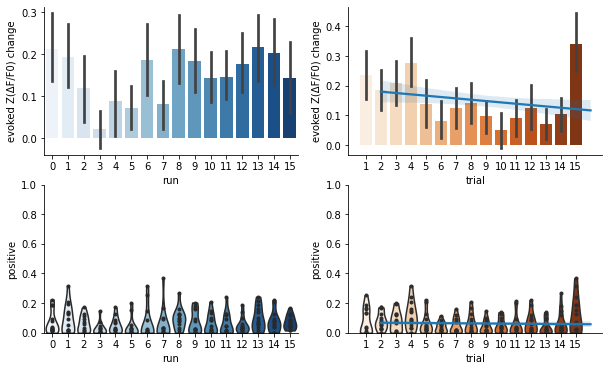

In [57]:
# Classify responses based on evoked change
ykey_diff = get_change_key(Label.ZSCORE)
zthr = pvalue_to_zscore(PTHR_DETECTION, directional=directional)
stats[Label.RESP_TYPE] = zscore_to_resp_type(stats[ykey_diff], zthr, directional=directional)

# Compute proportion of each response type per run & trial
props = get_responders_counts(
    valid(stats), Label.RUN, units=Label.TRIAL, normalize=True)
if 'positive' not in props.columns:
    props['positive'] = 0.

# Plot distributions along with their normality status
violin_kwargs = dict(
    inner='point',
    scale='width',
    cut=0,
    # bw=.3
)
figs['pct_posresps_violin'], axes = plt.subplots(2, 2, figsize=(10, 6))
for ax in axes.ravel():
    sns.despine(ax=ax)

for ax in axes[1]:
    ax.set_ylim(0, 1)

for (axrow, data, ykey, pltfunc, pltkwargs) in zip(
    axes, 
    [valid(stats), props], 
    [ykey_diff, 'positive'],
    [sns.barplot, sns.violinplot],
    [dict(), violin_kwargs],
    ):

    pltfunc(
        data=data.reset_index(Label.RUN),
        x=Label.RUN,
        y=ykey,
        palette='Blues',
        ax=axrow[0],
        **pltkwargs
    )
    pltfunc(
        data=data.reset_index(Label.TRIAL),
        x=Label.TRIAL,
        y=ykey,
        palette='Oranges',
        ax=axrow[1],
        **pltkwargs
    )
    sns.regplot(
        data=data.reset_index(Label.TRIAL),
        x=Label.TRIAL,
        y=ykey,
        ax=axrow[1],
        scatter=False,
    )

    aggdata = data[[ykey]].groupby(Label.TRIAL).mean().reset_index(Label.TRIAL)
    n = len(aggdata)
    corr = aggdata.corr().loc[Label.TRIAL, ykey]
    tstat = corrcoeff_to_tscore(corr, n)
    pval = tscore_to_pvalue(tstat, n)
    print(f'{ykey} ~ {Label.TRIAL}: r = {corr:.2f}, t-stat = {tstat:.2f}, p = {pval:.2f}')


### Compare variations of response strength across trials vs. ROIs with 2-way ANOVA

In [58]:
# groups = vstats[ykey_diff].groupby(Label.RUN)
# with tqdm(total=groups.ngroups - 1, position=0, leave=True) as pbar:
#     table = groups.agg(pbar_update(compute_ROI_vs_trial_anova, pbar))
# table = pd.DataFrame(
#     table.tolist(),
#     columns=[f'F({Label.TRIAL})', f'F({Label.ROI})'],
#     index=table.index)

# fig, ax = plt.subplots()
# sns.scatterplot(
#     data=table,
#     x=f'F({Label.TRIAL})',
#     y=f'F({Label.ROI})',
#     ax=ax
# )
# xymax = max(ax.get_xlim()[1], ax.get_ylim()[1])
# ax.set_xlim(0, xymax)
# ax.set_ylim(0, xymax)
# ax.axline((0, 0), (1, 1), ls='--', color='k')
# sns.despine(ax=ax)
# ax.set_aspect(1.)

### Aggregate timeseries and stats over valid trials

In [94]:
# Aggregate stats and timeseries over valid trials
logger.info('computing trial-aggregated stats and timeseries over valid trials...')
trial_agg_stats = get_trial_aggregated(vstats, aggfunc=trial_aggfunc)
trial_agg_timeseries = get_trial_aggregated(vtimeseries, aggfunc=trial_aggfunc)

# Add event rates to trial-aggregated timeseries
logger.info('adding event rates to trial-aggregated timeseries...')
trial_agg_timeseries[Label.EVENT_RATE] = event_rates.loc[trial_agg_timeseries.index]

# Print trial-aggregated stats
logger.info('trial-aggregated stats:')
trial_agg_stats

 2023/10/26 16:34:56: computing trial-aggregated stats and timeseries over valid trials...
 2023/10/26 16:34:56: data contains non-numeric columns -> string-proofing aggfunc
 2023/10/26 16:34:56: computing trial-median of data over ROI, run...
 2023/10/26 16:35:03: computing number of valid trials per ROI, run
 2023/10/26 16:35:03: rescaling z-score columns ['pre-stim avg Z(ΔF/F0)', 'shuffled pre-stim avg Z(ΔF/F0)', 'post-stim avg Z(ΔF/F0)', 'shuffled post-stim avg Z(ΔF/F0)', 'evoked Z(ΔF/F0) change', 'shuffled evoked Z(ΔF/F0) change']
 2023/10/26 16:35:03: computing trial-median of data over ROI, run, frame...
 2023/10/26 16:35:03: computing number of valid trials per ROI, run, frame
 2023/10/26 16:35:03: rescaling z-score columns ['Z(ΔF/F0)']
 2023/10/26 16:35:03: adding event rates to trial-aggregated timeseries...
 2023/10/26 16:35:03: trial-aggregated stats:


line  trial_length  PRF (Hz)  duration (s)   fps  P (MPa)  DC (%)  \
ROI run                                                                     
0   0     pv         100.0     100.0           0.2  3.56     0.80    50.0   
    1     pv         100.0     100.0           0.2  3.56     0.80    40.0   
    2     pv         100.0     100.0           0.2  3.56     0.80    30.0   
    3     pv         100.0     100.0           0.2  3.56     0.80    20.0   
    4     pv         100.0     100.0           0.2  3.56     0.80    10.0   
...      ...           ...       ...           ...   ...      ...     ...   
276 11    pv         100.0     100.0           0.2  3.56     0.05    50.0   
    12    pv         100.0     100.0           0.2  3.56     0.80    60.0   
    13    pv         100.0     100.0           0.2  3.56     0.80    70.0   
    14    pv         100.0     100.0           0.2  3.56     0.80    80.0   
    15    pv         100.0     100.0           0.2  3.56     0.80    50.0   

         run ID  I_SPPA (W/cm2)  I_SPTA (W/cm2)  ...  \
ROI run                                          ...   
0   0     257.0       19.784475        9.892238  ...   
    1     258.0       19.784475        7.913790  ...   
    2     259.0       19.784475        5.935343  ...   
    3     260.0       19.784475        3.956895  ...   
    4     261.0       19.784475        1.978448  ...   
...         ...             ...             ...  ...   
276 11    268.0        0.077283        0.038642  ...   
    12    269.0       19.784475       11.870685  ...   
    13    270.0       19.784475       13.849133  ...   
    14    271.0       19.784475       15.827580  ...   
    15    272.0       19.784475        9.892238  ...   

         shuffled evoked ΔF/F0 change  pre-stim avg Z(ΔF/F0)  \
ROI run                                                        
0   0                        0.031035               0.071058   
    1                        0.005655              -0.705024   
    2                       -0.023796              -1.212651   
    3                        0.005305              -0.906162   
    4                        0.027125              -1.598682   
...                               ...                    ...   
276 11                       0.000689              -0.839325   
    12                       0.003085              -0.990893   
    13                      -0.002716              -0.999502   
    14                      -0.001213              -0.258657   
    15                      -0.007588              -0.816412   

         shuffled pre-stim avg Z(ΔF/F0)  post-stim avg Z(ΔF/F0)  \
ROI run                                                           
0   0                          4.480154                0.721476   
    1                          3.273316                0.168313   
    2                          2.336989               -1.745306   
    3                          1.257954                0.125504   
    4                          1.464113               -2.067763   
...                                 ...                     ...   
276 11                         0.230273               -0.038412   
    12                         0.580408               -0.362550   
    13                         0.243848                0.294642   
    14                         0.248887               -0.131940   
    15                         0.226909                0.133900   

         shuffled post-stim avg Z(ΔF/F0)  evoked Z(ΔF/F0) change  \
ROI run                                                            
0   0                           4.412246                1.135420   
    1                           0.951887                1.051194   
    2                           0.923607               -0.532655   
    3                           2.092918                0.747959   
    4                           1.949782               -0.465637   
...                                  ...                     ...   
276 11                      

### Visualize relative trial-averaged traces and heatmaps

 2023/10/25 17:47:26: grouping data by ['run', 'frame'] and averaging...
 2023/10/25 17:47:26: adding time info to table...
 2023/10/25 17:47:26: ΔF/F0: expanding 75800-rows series into 51 ROIs x 15 runs x 100 frames (76500-rows) series (700 additional rows)
 2023/10/25 17:47:26: adding time info to table...
 2023/10/25 17:47:27: plotting ΔF/F0 trial heatmaps...


15it [00:04,  3.19it/s]                        


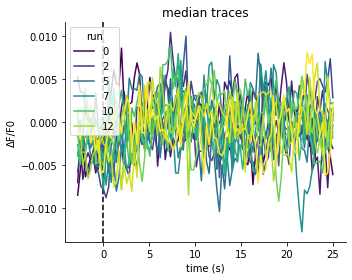

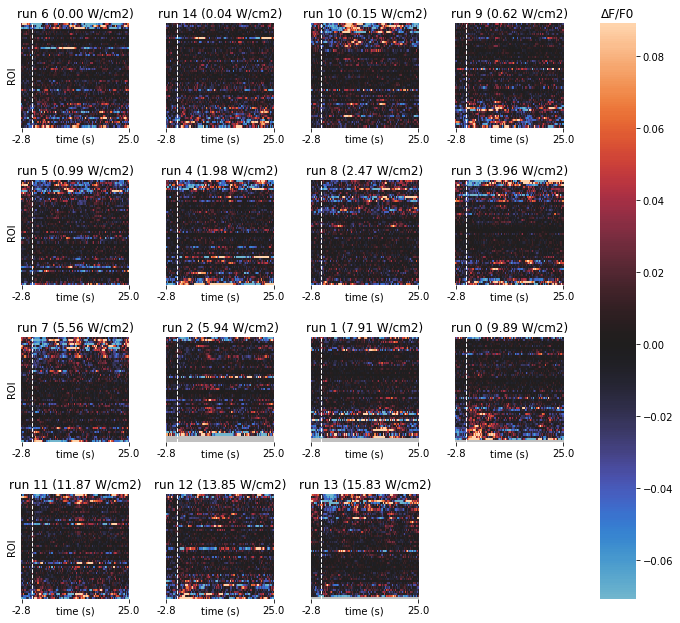

In [45]:
ykeys_plt = [Label.DFF] # , Label.ZSCORE, Label.EVENT_RATE]
figs[f'trial-averaged aggregate traces valid'], axes = plt.subplots(
    1, len(ykeys_plt), figsize=(5 * len(ykeys_plt), 4))
axes = np.atleast_1d(axes)
for ykey, ax in zip(ykeys_plt, axes):
    plot_aggregate_traces(
        trial_agg_timeseries, fps, ykey, hue=Label.RUN, ax=ax, 
        aggfunc=trial_aggfunc)
    figs[f'{ykey} heatmaps'] = plot_activity_heatmap(
        trial_agg_timeseries, ykey, fps, col=Label.RUN,
        col_order=sorted_ISPTAs.index.values, 
        col_labels=sorted_ISPTAs.values,
        sort_ROIs=True, rasterized=True)

### Response type, pressure & duty cycle dependency

 2023/10/25 17:47:35: adding 25-column stats information to timeseries...
 2023/10/25 17:47:35: adding time info to table...
 2023/10/25 17:47:35: sub-indexing data...
 2023/10/25 17:47:35: filtering data...
 2023/10/25 17:47:35: cross-checking filters...
 2023/10/25 17:47:35: grouping by P (MPa), averaging and plotting mean ΔF/F0 vs. time (s) ...
 2023/10/25 17:47:36: sub-indexing data...
 2023/10/25 17:47:36: filtering data...
 2023/10/25 17:47:36: cross-checking filters...
 2023/10/25 17:47:36: grouping by DC (%), averaging and plotting mean ΔF/F0 vs. time (s) ...


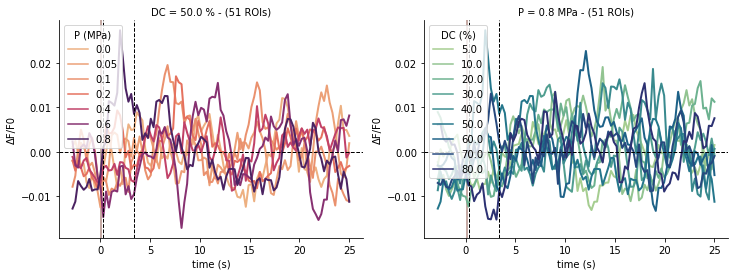

In [46]:
plt_data = get_plot_data(trial_agg_timeseries, trial_agg_stats)
tracekwargs = dict(
    errorbar=None,
    yref=0.,
)
if Label.SUFFIX not in output_info_table:
    figs['traces params deps'], axes = plt.subplots(
        len(ykeys_plt), 2, figsize=(12, 4 * len(ykeys_plt)))
    axes = np.atleast_2d(axes)
    for i, (ykey, axrow) in enumerate(zip(ykeys_plt, axes)):
        # Pressure dependency
        plot_responses(
            plt_data, ykey=ykey, DC=DC_REF, hue=Label.P, ax=axrow[0], **tracekwargs)
        # DC dependency
        plot_responses(
            plt_data, ykey=ykey, P=P_REF, hue=Label.DC, ax=axrow[1], **tracekwargs)
        for ax in axrow:
            sns.despine(ax=ax)
            if i > 0:
                ax.set_title(None)
        harmonize_axes_limits(axrow)

### Heatmaps & average trace together, for pressure & DC

 2023/10/25 17:47:39: Z(ΔF/F0): expanding 75800-rows series into 51 ROIs x 15 runs x 100 frames (76500-rows) series (700 additional rows)
 2023/10/25 17:47:39: adding time info to table...
 2023/10/25 17:47:39: plotting Z(ΔF/F0) trial heatmaps...


 17%|█▋        | 1/6 [00:00<00:01,  2.99it/s]

 2023/10/25 17:47:40: skipping run 1
 2023/10/25 17:47:40: skipping run 2
 2023/10/25 17:47:40: skipping run 3
 2023/10/25 17:47:40: skipping run 4
 2023/10/25 17:47:40: skipping run 5


100%|██████████| 6/6 [00:01<00:00,  3.38it/s]

 2023/10/25 17:47:41: skipping run 11
 2023/10/25 17:47:41: skipping run 12
 2023/10/25 17:47:41: skipping run 13


7it [00:02,  3.36it/s]                       

 2023/10/25 17:47:41: sub-indexing data...
 2023/10/25 17:47:41: filtering data...
 2023/10/25 17:47:41: cross-checking filters...
 2023/10/25 17:47:41: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:41: sub-indexing data...
 2023/10/25 17:47:41: filtering data...
 2023/10/25 17:47:41: cross-checking filters...
 2023/10/25 17:47:41: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...


 2023/10/25 17:47:42: sub-indexing data...
 2023/10/25 17:47:42: filtering data...
 2023/10/25 17:47:42: cross-checking filters...
 2023/10/25 17:47:42: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:42: sub-indexing data...
 2023/10/25 17:47:42: filtering data...
 2023/10/25 17:47:42: cross-checking filters...
 2023/10/25 17:47:42: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:42: sub-indexing data...
 2023/10/25 17:47:42: filtering data...
 2023/10/25 17:47:42: cross-checking filters...
 2023/10/25 17:47:42: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:42: sub-indexing data...
 2023/10/25 17:47:42: filtering data...
 2023/10/25 17:47:42: cross-checking filters...
 2023/10/25 17:47:42: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:42: sub-indexing data.

 75%|███████▌  | 6/8 [00:02<00:00,  2.86it/s]

 2023/10/25 17:47:45: skipping run 6
 2023/10/25 17:47:45: skipping run 7
 2023/10/25 17:47:45: skipping run 8
 2023/10/25 17:47:45: skipping run 9
 2023/10/25 17:47:45: skipping run 10


9it [00:03,  2.97it/s]                       

 2023/10/25 17:47:46: skipping run 14


9it [00:03,  2.89it/s]

 2023/10/25 17:47:46: sub-indexing data...
 2023/10/25 17:47:46: filtering data...
 2023/10/25 17:47:46: cross-checking filters...
 2023/10/25 17:47:46: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:46: sub-indexing data...
 2023/10/25 17:47:46: filtering data...
 2023/10/25 17:47:46: cross-checking filters...
 2023/10/25 17:47:46: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...


 2023/10/25 17:47:46: sub-indexing data...
 2023/10/25 17:47:46: filtering data...
 2023/10/25 17:47:46: cross-checking filters...
 2023/10/25 17:47:46: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:46: sub-indexing data...
 2023/10/25 17:47:46: filtering data...
 2023/10/25 17:47:46: cross-checking filters...
 2023/10/25 17:47:46: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:46: sub-indexing data...
 2023/10/25 17:47:46: filtering data...
 2023/10/25 17:47:46: cross-checking filters...
 2023/10/25 17:47:46: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:47: sub-indexing data...
 2023/10/25 17:47:47: filtering data...
 2023/10/25 17:47:47: cross-checking filters...
 2023/10/25 17:47:47: averaging, estimating confidence intervals and plotting mean Z(ΔF/F0) vs. time (s) ...
 2023/10/25 17:47:47: sub-indexing data.

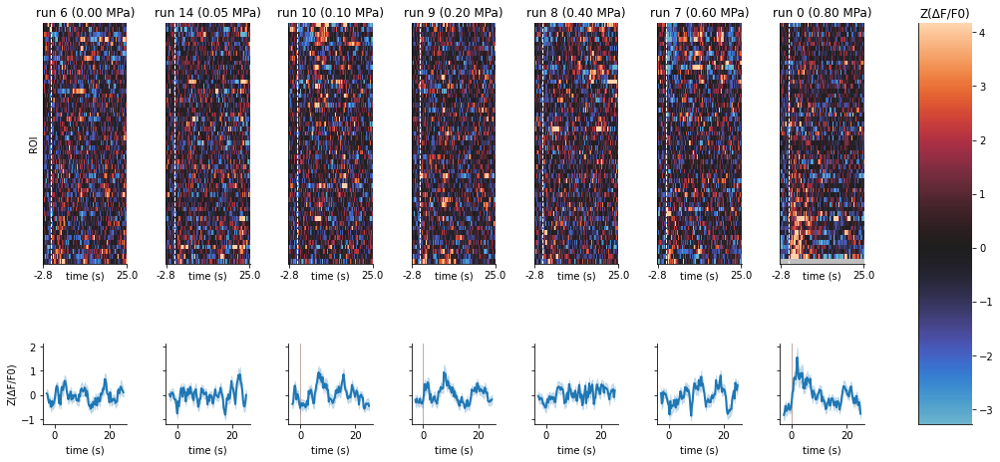

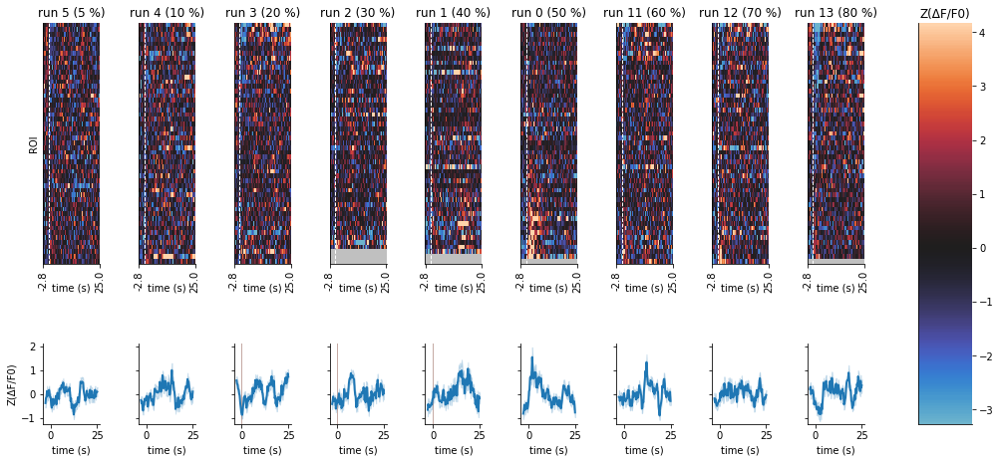

In [47]:
ykey = Label.ZSCORE

for xkey, xfmt in zip([Label.P, Label.DC], ['{:.2f} MPa', '{:.0f} %']):
    # Get sorted list of runs pertaining to parameter sweep
    sorted_xkeys = (
        get_xdep_data(trial_agg_stats, xkey)[xkey]
        .groupby(Label.RUN).first().sort_values()
        .apply(xfmt.format)
    )

    # If at least 1 condition exists in this parameter sweep
    if len(sorted_xkeys) > 0:

        # Create new figure
        n = len(sorted_xkeys)
        figs[f'{ykey} heatmaps and avgtraces vs {xkey}'], axes = plt.subplots(
            2, n, figsize=(15, 7), height_ratios=[3, 1])

        # Plot heatmaps of these runs
        plot_activity_heatmap(
            trial_agg_timeseries, ykey, fps, 
            col=Label.RUN,
            col_order=sorted_xkeys.index.values, 
            col_labels=sorted_xkeys.values,
            colwrap=len(sorted_xkeys),
            sort_ROIs=True, rasterized=True,
            axes=axes[0])

        # Plot average traces for these runs
        for ax, (glabel, gdata) in zip(axes[1], get_xdep_data(plt_data, xkey).groupby(xkey)):
            plot_responses(
                gdata, 
                ykey=ykey,
                ax=ax,
                mark_analysis_window=False,
            )
            ax.set_title(None)
        harmonize_axes_limits(axes[1])
        for ax in axes[1, 1:]:
            ax.set_ylabel(None)
            ax.set_yticklabels([])

### Assess pre-stim and post-stim activity levels, and their differences

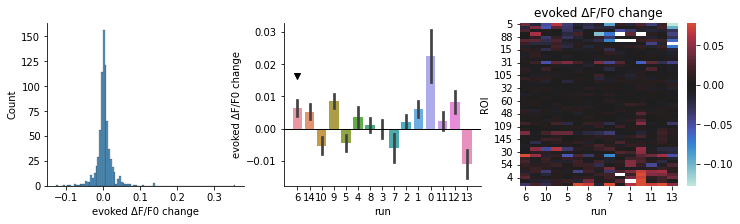

In [48]:
for ykey in ykeys_plt:
    # Plot evoked change graphs
    figs[f'curated {ykey_diff} graphs'] = plot_stat_graphs(
        trial_agg_stats, 
        get_change_key(ykey), 
        run_order=sorted_ISPTAs, 
        irun_marker=irun_P0
    )

### Identify response type for each ROI & condition using statistical tests on evoked change

 2023/10/25 17:47:53: classifying responses using directional z-score thresholding ...


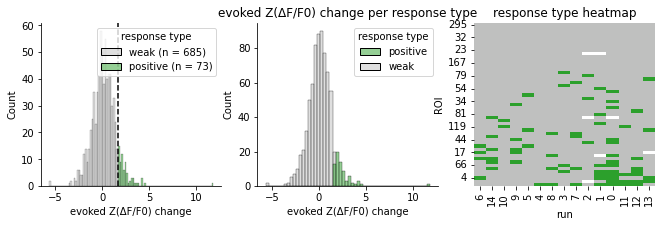

In [49]:
from constants import RTYPE_MAP
ykey_diff = get_change_key(ykey_classification)

# Compute evoked z-score changes
# trial_agg_stats[ykey_diff] = compute_evoked_change(trial_agg_timeseries, Label.ZSCORE)

# Classify responses
zthr = pvalue_to_zscore(PTHR_DETECTION, directional=directional)
trial_agg_stats[Label.RESP_TYPE] = zscore_to_resp_type(
    trial_agg_stats[ykey_diff], 
    zthr, 
    directional=directional
)

# Count number of responses per response type
counts_per_rtype = trial_agg_stats[Label.RESP_TYPE].value_counts()

# Create figure
figs['response classification'], axes = plt.subplots(1, 3, figsize=(11, 3))
for ax in axes:
    sns.despine(ax=ax)

# Plot response t-stat histogram per resppnse type
ax = axes[0]
sns.histplot(
    ax=ax,
    data=trial_agg_stats,
    x=ykey_diff,
    bins=100,
    hue=Label.RESP_TYPE,
    hue_order=get_default_rtypes(),
    palette=Palette.RTYPE, 
)
if not directional:
    ax.axvline(-zthr, ls='--', c='k')
ax.axvline(zthr, ls='--', c='k')
leg = ax.get_legend()
for t in leg.texts:
    s = t.get_text()
    try:
        cs = counts_per_rtype.loc[s]
    except KeyError:
        cs = 0
    t.set_text(f'{s} (n = {cs:.0f})')

# Plot response strength histogram with condition type color code
ax = axes[1]
ax.set_title(f'{ykey_diff} per response type')
sns.histplot(
    ax=ax, 
    data=trial_agg_stats,
    x=ykey_diff, 
    hue=Label.RESP_TYPE, 
    palette=Palette.RTYPE
)

# Plot response type map per ROI & run
ax = axes[2]
# Order ROIs by increasing number of positive responses (if any)
try:
    nposconds_per_ROI = (
        trial_agg_stats[Label.RESP_TYPE]
        .groupby(Label.ROI)
        .value_counts()
        .unstack()['positive']
        .fillna(0.)
        .sort_values()
    )
except KeyError:
    nposconds_per_ROI = pd.Series(0., index=trial_agg_stats.index.unique(Label.ROI))
ROI_order = nposconds_per_ROI.index
ax.set_title(f'{Label.RESP_TYPE} heatmap')
poscondsmap = (trial_agg_stats[Label.RESP_TYPE]
    .replace(swapdict(RTYPE_MAP))
    .unstack()
    .reindex(ROI_order, axis=0)
    .reindex(sorted_ISPTAs.index.values, axis=1)
)
sns.heatmap(
    ax=ax,
    data=poscondsmap, 
    cbar=False,
    cmap=rtype_cmap,
    center=0
);

### Identify responding cells based on the fraction of conditions yelding positive responses

 2023/10/25 17:47:56: computing fraction of response occurence per ROI over 9 "strong ISPTA" conditions...
 2023/10/25 17:47:56: classiying ROIs as a function of their response occurence fractions...
 2023/10/25 17:47:57: expanding (51 ROIs) input dataframe to match (51 ROIs x 15 runs x 16 trials) reference dataframe
 2023/10/25 17:47:57: expanding (51 ROIs) input dataframe to match (51 ROIs x 15 runs) reference dataframe
 2023/10/25 17:47:57: cell breakdown:
  - weak: 49 (96.1%)
  - positive: 2 (3.9%)


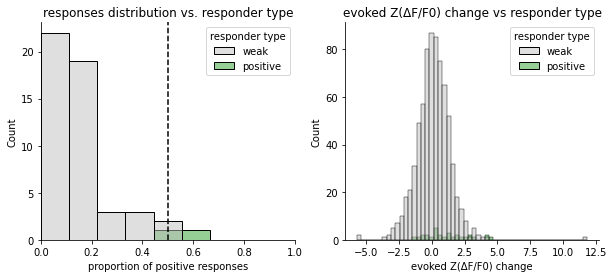

In [50]:
# Compute fraction of response occurence in "strong" ISPTA conditions, for each ROI
from constants import ISPTA_THR
roistats = get_rtype_fractions_per_ROI(trial_agg_stats)

# Compute number of strong ISPTA "conditions"
nstrong_isptas = (output_info_table[Label.ISPTA] > ISPTA_THR).sum()

# Classify ROIs based on proportion of conditions in each response type
logger.info('classiying ROIs as a function of their response occurence fractions...')
from constants import PROP_CONDS_THR

# Assess whether weak is the only type of response
is_only_weak = len(roistats.columns) == 1 and 'weak' in roistats.columns

# If weak is the only type, add "positive" column filled with zeros 
if is_only_weak:
    logger.warning('no non-weak responses found')
    roistats['positive'] = 0.
nonweakresps = roistats.drop('weak', axis=1).agg(['idxmax', 'max'], axis=1)
isbignonweakfrac = nonweakresps['max'] >= PROP_CONDS_THR
roistats[Label.ROI_RESP_TYPE] = 'weak'
roistats.loc[isbignonweakfrac, Label.ROI_RESP_TYPE] = nonweakresps.loc[isbignonweakfrac, 'idxmax']

# Add roistats to stats and trial-averaged stats
vstats = free_expand_and_add(roistats, vstats.copy())
trial_agg_stats = free_expand_and_add(roistats, trial_agg_stats.copy())

# Log number and percentage of cells of each responder type identified
ncells_per_type = roistats[Label.ROI_RESP_TYPE].value_counts()
ncells_tot = ncells_per_type.sum()
logstr = []
for rtype, count in ncells_per_type.items():
    logstr.append(f'  - {rtype}: {count} ({count / ncells_tot * 100:.1f}%)')
logstr = "\n".join(logstr)
logger.info(f'cell breakdown:\n{logstr}')

# Create figure
figs['responder classification'], axes = plt.subplots(1, 2, figsize=(10, 4))
for ax in axes:
    sns.despine(ax=ax)

# Plot histogram of # responses of each type per responder category
ax = axes[0]
ax.set_title(f'responses distribution vs. {Label.ROI_RESP_TYPE}')
if directional:
    ax.set_xlabel('proportion of positive responses')
    histkwargs = dict(x='positive')
else:
    ax.set_xlabel('proportion of negative responses')
    ax.set_ylabel('proportion of positive responses')
    histkwargs = dict(x='negative', y='positive')
if not is_only_weak:
    sns.histplot(
        data=roistats, 
        ax=ax, 
        binwidth=1 / nstrong_isptas,
        hue=Label.ROI_RESP_TYPE, 
        hue_order=get_default_rtypes(), 
        palette=Palette.RTYPE,
        **histkwargs
    )
ax.axvline(PROP_CONDS_THR, c='k', ls='--')
ax.set_xlim(0, 1)
if not directional:
    ax.axhline(PROP_CONDS_THR, c='k', ls='--')
    ax.set_ylim(0, 1)

# Plot response strength histogram with cell classification
ax = axes[1]
ax.set_title(f'{ykey_diff} vs {Label.ROI_RESP_TYPE}')
sns.histplot(
    data=trial_agg_stats, x=ykey_diff, ax=ax,
    hue=Label.ROI_RESP_TYPE, hue_order=get_default_rtypes(), palette=Palette.RTYPE);

### Save processed data to disk

In [51]:
processed_dir = get_output_equivalent(
    conditioning_dir, DataRoot.CONDITIONED, f'{DataRoot.PROCESSED}/{processing_id}')
processed_fpath = os.path.join(processed_dir, os.path.basename(conditioned_fpath))
map_ops = {
    'micronsPerPixel': um_per_px,
    'Lx': s2p_ops['Lx'],
    'Ly': s2p_ops['Ly'],
    'Vcorr': s2p_ops['Vcorr'],
    'max_proj': s2p_ops['max_proj'],
}
for i, Vmap in enumerate(s2p_ops['Vmap']):
    map_ops[f'Vmap{i}'] = Vmap

from fileops import save_processed_dataset
save_processed_dataset(
    processed_fpath,
    trial_agg_timeseries,
    popagg_timeseries,
    stats, # vstats,
    trial_agg_stats,
    ROI_masks, 
    map_ops
)

## Results visualization

Several key analysis outputs are visualized:
- summary of the neural populations per responder type & their spatial distribution across the field of view
- parameter-dependency of response metrics for each responder type.
- parameter-dependent aggregate traces of activity metrics (ΔF/F0 and event rate) for each  responder type

### Timelapse images for baseline run 

 2023/10/25 17:48:05: plotting frames 8 - 22 from trials 0 - 15...


  0%|          | 0/16 [00:00<?, ?it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


  6%|▋         | 1/16 [00:00<00:01,  9.63it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 12%|█▎        | 2/16 [00:00<00:01,  9.68it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 19%|█▉        | 3/16 [00:00<00:01,  9.70it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 25%|██▌       | 4/16 [00:00<00:01,  9.60it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 31%|███▏      | 5/16 [00:00<00:01,  9.53it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 38%|███▊      | 6/16 [00:00<00:01,  9.47it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 44%|████▍     | 7/16 [00:00<00:00,  9.46it/s]

 2023/10/25 17:48:05: initializing stack viewer
 2023/10/25 17:48:05: stack size: (24000, 256, 256)


 50%|█████     | 8/16 [00:00<00:00,  9.43it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 56%|█████▋    | 9/16 [00:00<00:00,  9.39it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 62%|██████▎   | 10/16 [00:01<00:00,  9.40it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 69%|██████▉   | 11/16 [00:01<00:00,  9.48it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 75%|███████▌  | 12/16 [00:01<00:00,  9.44it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 81%|████████▏ | 13/16 [00:01<00:00,  9.31it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 88%|████████▊ | 14/16 [00:01<00:00,  9.45it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


 94%|█████████▍| 15/16 [00:01<00:00,  9.35it/s]

 2023/10/25 17:48:06: initializing stack viewer
 2023/10/25 17:48:06: stack size: (24000, 256, 256)


100%|██████████| 16/16 [00:01<00:00,  9.41it/s]


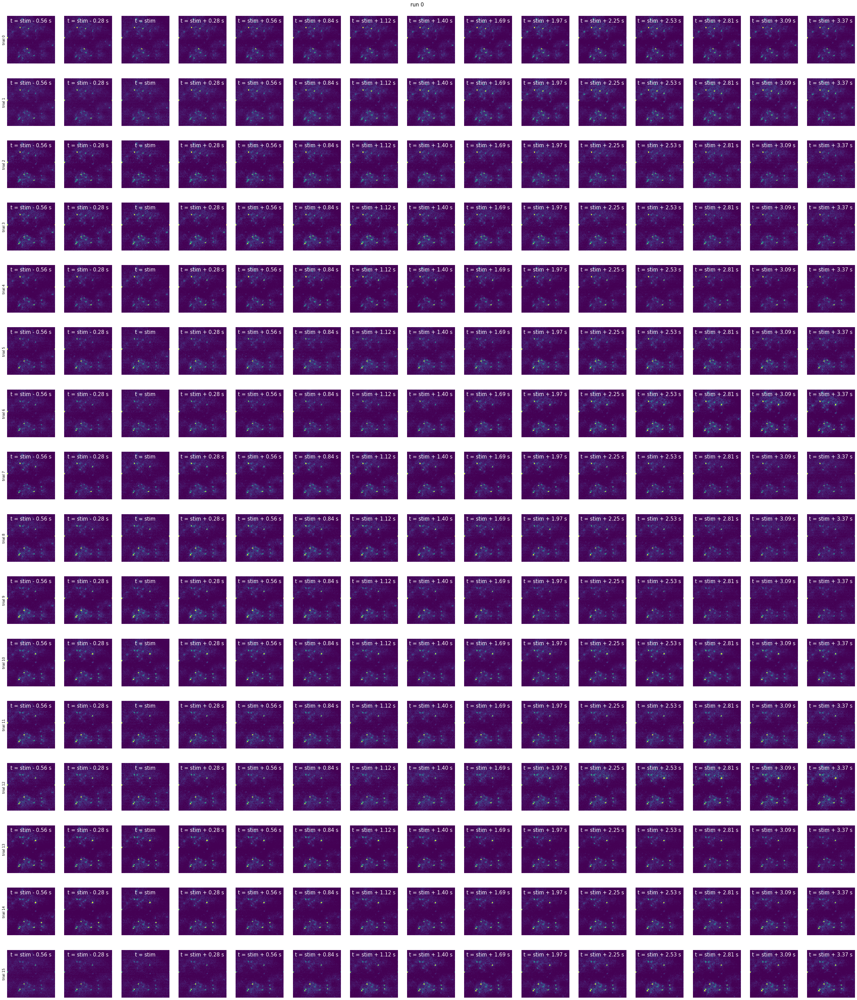

In [52]:
# Extract run index of reference condition (or fall back to first run)
pbyrun = get_params_by_run(output_info_table)
isrefcond = (pbyrun[Label.P] == P_REF) & (pbyrun[Label.DC] == DC_REF) 
if isrefcond.sum() > 0:
    irun_refcond = pbyrun[isrefcond].index[0]
else:
    irun_refcond = 0

# Plot frames for that run - trial combination
itrial_plot = None  # extract frames from all trials
iframes = get_frames_indexes(irelstart=-2, irelend=12, every=1)
figs['frames refcond'] = plot_registered_frames(
    s2p_ops, irun_refcond, itrial_plot, iframes, fps=fps, 
    qmin=.2, qmax=.999)

### Dataset summary

 2023/10/25 17:48:42: generating cells map color-coded by fraction of positive responses


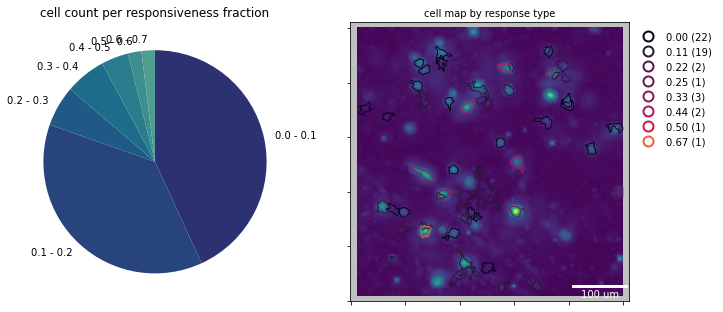

In [53]:
# Counts cells by interval of responsiveness fraction
posfracs_by_cell = trial_agg_stats.groupby(Label.ROI)['positive'].first()
fracdelims = np.arange(0, 1.01, 0.1)
counts_by_posfrac = pd.Series(
    data=np.histogram(posfracs_by_cell, bins=fracdelims)[0], 
    index=[f'{lb:.1f} - {ub:.1f}' for lb, ub in zip(fracdelims[:-1], fracdelims[1:])]
)

# Create figure
figs['dataset summary'], axes = plt.subplots(1, 2, figsize=(11, 6))

# Plot counts on pie chart
ax = axes[0]
ax.set_title('cell count per responsiveness fraction')
counts_by_posfrac.plot.pie(
    ax=ax, 
    cmap='crest_r', 
    startangle=90,
    counterclock=False,
    wedgeprops={'edgecolor': None}
)
ax.set_ylabel('')

# Spatial distribution of cells per response type
plot_field_of_view(
    map_ops, ROI_masks, trial_agg_stats, title='cell map by response type',
    um_per_px=um_per_px, refkey='Vcorr', mode='contour', hue='positive', ax=axes[1]);

 2023/10/25 17:48:44: Computing average response scores over 6-by-6 grid
 2023/10/25 17:48:44: defining unstructured cubic interpolator from 18/25 grid points
 2023/10/25 17:48:44: applying interpolator over 256-by-256 evaluation grid


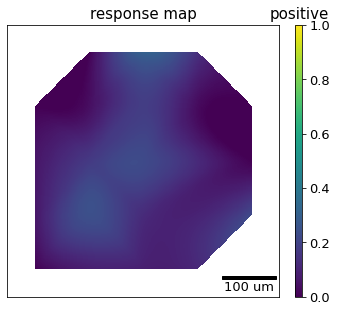

In [54]:
figs['resp spatial map'] = plot_response_map(
    ROI_masks, trial_agg_stats, map_ops, um_per_px=um_per_px, title='response map')

### Response strength parameter dependency per responder type

 2023/10/25 17:49:49: sub-indexing data...
 2023/10/25 17:49:49: filtering data...
 2023/10/25 17:49:49: cross-checking filters...
 2023/10/25 17:49:49: averaging, estimating confidence intervals and plotting mean evoked ΔF/F0 change vs. P (MPa) ...
 2023/10/25 17:49:49: sub-indexing data...
 2023/10/25 17:49:49: filtering data...
 2023/10/25 17:49:49: cross-checking filters...
 2023/10/25 17:49:49: averaging, estimating confidence intervals and plotting mean evoked ΔF/F0 change vs. DC (%) ...


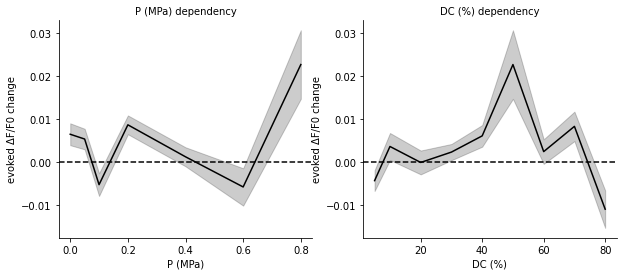

In [56]:
if Label.SUFFIX not in output_info_table:
    figs[f'stimparams dependency per rtype'], axes = plt.subplots(
        len(ykeys_plt), 2, figsize=(10, 4 * len(ykeys_plt)))
    axes = np.atleast_2d(axes)
    for ykey, axrow in zip(ykeys_plt, axes):
        ykey_diff = get_change_key(ykey)
        plot_stimparams_dependency(
            trial_agg_stats, 
            ykey_diff, 
            yref=0, 
            color='k',
            # hue=Label.ROI_RESP_TYPE, 
            # palette=Palette.RTYPE,
            avgprop='whue', 
            errprop='intra', 
            axes=axrow
        )
    for axrow in axes[1:]:
        for ax in axrow:
            ax.set_title(None)
    for axrow in axes[:-1]:
        for ax in axrow:
            ax.set_xlabel(None)

### Response type, pressure & duty cycle dependency, per category

 2023/10/25 17:28:42: adding 29-column stats information to timeseries...
 2023/10/25 17:28:43: adding time info to table...
 2023/10/25 17:28:43: sub-indexing data...
 2023/10/25 17:28:43: filtering data...
 2023/10/25 17:28:43: cross-checking filters...
 2023/10/25 17:28:43: grouping by responder type, grouping by P (MPa), averaging and plotting mean ΔF/F0 vs. time (s) ...
 2023/10/25 17:28:44: sub-indexing data...
 2023/10/25 17:28:44: filtering data...
 2023/10/25 17:28:44: cross-checking filters...
 2023/10/25 17:28:44: grouping by responder type, grouping by DC (%), averaging and plotting mean ΔF/F0 vs. time (s) ...


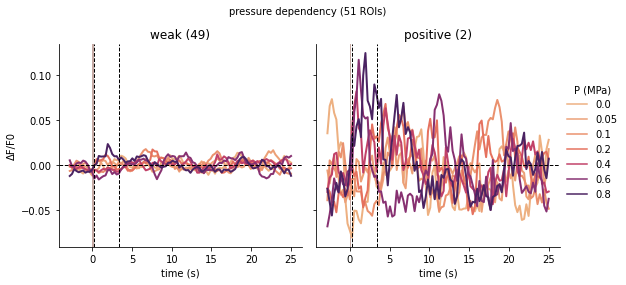

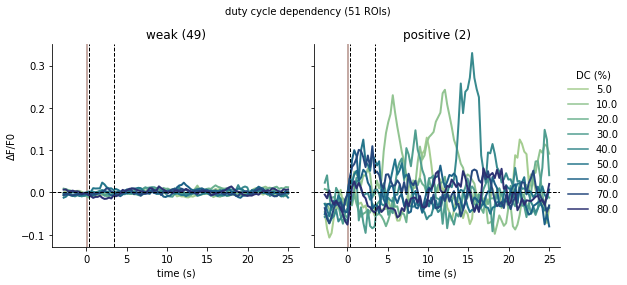

In [68]:
if Label.SUFFIX not in output_info_table:
    plt_data = get_plot_data(trial_agg_timeseries, trial_agg_stats)
    nROIs = len(trial_agg_stats.index.unique(level=Label.ROI))
    tracekwargs = dict(
        height = 4,  # height of each figure axis
        aspect = 1.,  # width / height aspect ratio of each axis
        hide_col_prefix = True,
        col_count_key = Label.ROI,
        errorbar=None,
        yref=0.
    )
    for ykey in ykeys_plt:
        # Pressure dependency
        nconds_Psweep = len(get_xdep_data(trial_agg_stats, Label.P).groupby(Label.RUN).first())
        if nconds_Psweep > 0:
            figs[f'{ykey} traces by type DC={DC_REF}%'] = plot_responses(
                plt_data, ykey=ykey, DC=DC_REF, hue=Label.P, 
                col=Label.ROI_RESP_TYPE, title=f'pressure dependency ({nROIs} ROIs)', **tracekwargs)
        # Duty cycle dependency
        nconds_DCsweep = len(get_xdep_data(trial_agg_stats, Label.DC).groupby(Label.RUN).first())
        if nconds_DCsweep > 0:
            figs[f'{ykey} traces by type P={P_REF}MPa'] = plot_responses(
                plt_data, ykey=ykey, P=P_REF, hue=Label.DC, 
                col=Label.ROI_RESP_TYPE, title=f'duty cycle dependency ({nROIs} ROIs)', **tracekwargs)

### Save figures

In [55]:
figs = {k: v for k, v in figs.items() if v is not None}
save_figs_book(figsdir, figs, suffix=figs_suffix)

# Save stacks as GIFs if specified
if irun_inspect is not None and save_gifs:
    #raw and fileted stacks from specific run
    save_stack_to_gif(
        figsdir, {'raw': raw_stack_fpaths[irun_inspect], 'filtered': filtered_stack_fpaths[irun_inspect]},
        ilabels=i_stim_frames_run)
    # registered stack (slice corresponding to specific run)
    save_stack_to_gif(
        figsdir, s2p_ops, title=outstack_label,
        ilabels=istimframes_stacked, bounds=runbounds)

 2023/10/24 13:12:26: saving figures in /gpfs/scratch/lemait01/data/usnm/figs/2023.10.24/figs_pv_20190821_mouse7_region1_klinreg_nointercept_k0.5_alpha0.7_qadaptive_wq10.0s_aggmedian_classzscore_directional.pdf:


100%|██████████| 61/61 [02:31<00:00,  2.49s/it]


### Notify upon completion

In [56]:
# Get time stamp from notebook completion
tstamp_end = datetime.datetime.now()

# Log completion process
s = f'{dataset_id} notebook completed in {tstamp_end - tstamp_start} s'
if slack_notify:
    jupyter_slack.notify_self(s)
logger.info(s)

 2023/10/24 13:15:02: 20190821_mouse7_region1 notebook completed in 0:10:07.624421 s
